In [1]:
library(IRdisplay)
display_html("<style>.container { width:100% !important; }</style>")

.libPaths()

[1] "/hps/software/users/marioni/Leah/miniconda3/envs/basic_renv/lib/R/library"

In [2]:
suppressPackageStartupMessages(library(data.table))
suppressPackageStartupMessages(library(ggplot2))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(viridis))
suppressPackageStartupMessages(library(Matrix))
suppressPackageStartupMessages(library(stringr))
suppressPackageStartupMessages(library(ggrepel))
source('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/gastruloids_scRNAseq/plotting_settings.R')

In [3]:
srat <- readRDS("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/seurat_QCed.rds")
srat

An object of class Seurat 
30406 features across 77683 samples within 1 assay 
Active assay: RNA (30406 features, 4214 variable features)
 2 dimensional reductions calculated: pca, umap

# De novo cell type annotation

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 77683
Number of edges: 5271756

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8949
Number of communities: 16
Elapsed time: 76 seconds


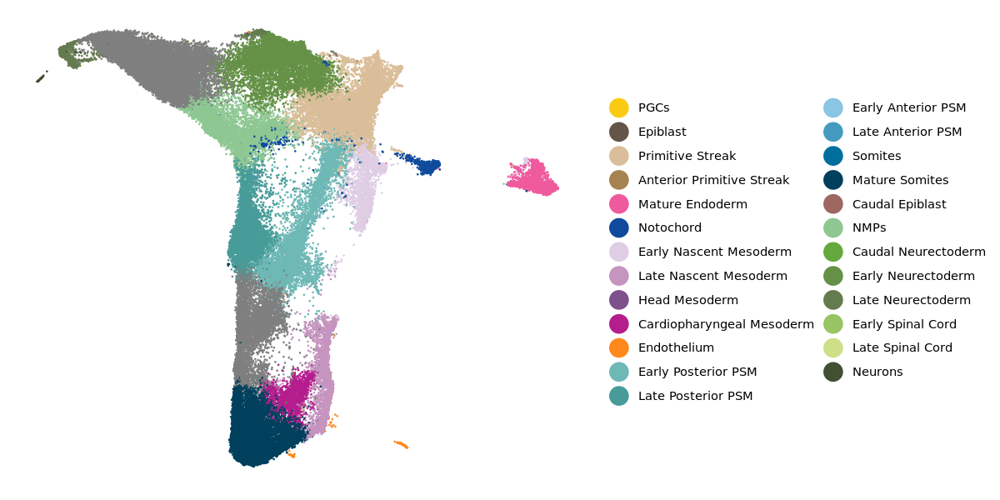

In [4]:
srat <- FindNeighbors(srat, dims = 1:50, k.param = 30, reduction = "pca")
srat <- FindClusters(srat, resolution = 0.6, random.seed=0)

plot_df_joined <- as.data.table(srat@meta.data)

plot_df_joined[, cluster := 'unlabelled']
plot_df_joined[`RNA_snn_res.0.6` == '0', cluster := 'Spinal Cord']
plot_df_joined[`RNA_snn_res.0.6` == '1', cluster := 'Mature Somites']
plot_df_joined[`RNA_snn_res.0.6` == '2', cluster := 'Primitive Streak']
plot_df_joined[`RNA_snn_res.0.6` == '3', cluster := 'Early Neurectoderm']
plot_df_joined[`RNA_snn_res.0.6` == '4', cluster := 'Early Posterior PSM']
plot_df_joined[`RNA_snn_res.0.6` == '5', cluster := 'Anterior PSM and Somites']
plot_df_joined[`RNA_snn_res.0.6` == '6', cluster := 'Late Posterior PSM']
plot_df_joined[`RNA_snn_res.0.6` == '7', cluster := 'NMPs']
plot_df_joined[`RNA_snn_res.0.6` == '8', cluster := 'Late Nascent Mesoderm']
plot_df_joined[`RNA_snn_res.0.6` == '9', cluster := 'Mature Endoderm']
plot_df_joined[`RNA_snn_res.0.6` == '10', cluster := 'Early Nascent Mesoderm']
plot_df_joined[`RNA_snn_res.0.6` == '11', cluster := 'Cardiopharyngeal Mesoderm']
plot_df_joined[`RNA_snn_res.0.6` == '12', cluster := 'Late Neurectoderm']
plot_df_joined[`RNA_snn_res.0.6` == '13', cluster := 'Notochord']
plot_df_joined[`RNA_snn_res.0.6` == '14', cluster := 'Endothelium']
plot_df_joined[`RNA_snn_res.0.6` == '15', cluster := 'Neurons']

options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=cluster)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = cluster_colours[cluster_order], name = "Celltype") +
  #scale_colour_manual(values = cluster_colours, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  theme(line = element_blank(),
        axis.text=element_blank(),
        title = element_blank())
print(p)


srat@meta.data <- merge(srat@meta.data, plot_df_joined[,c("cell", "cluster")], all.x=TRUE, all.y=FALSE)
rownames(srat@meta.data) <- srat@meta.data$cell

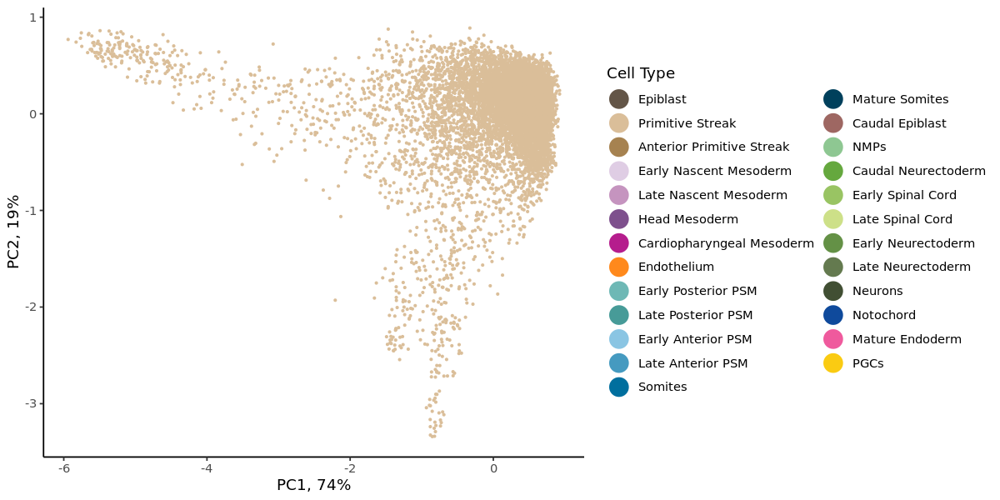

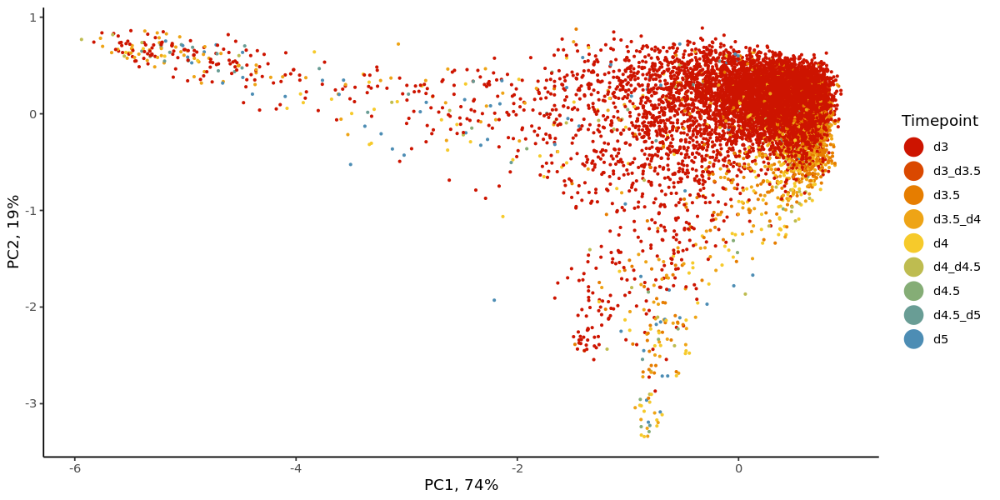

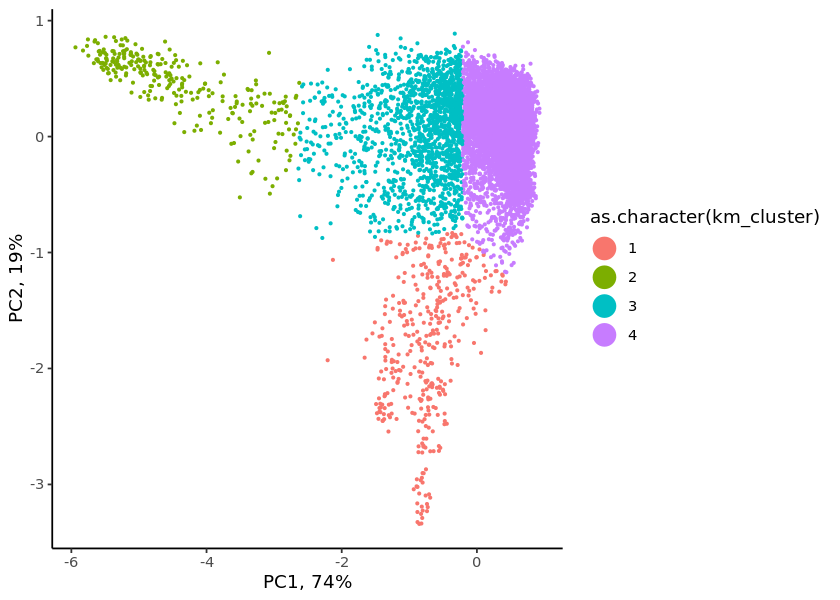

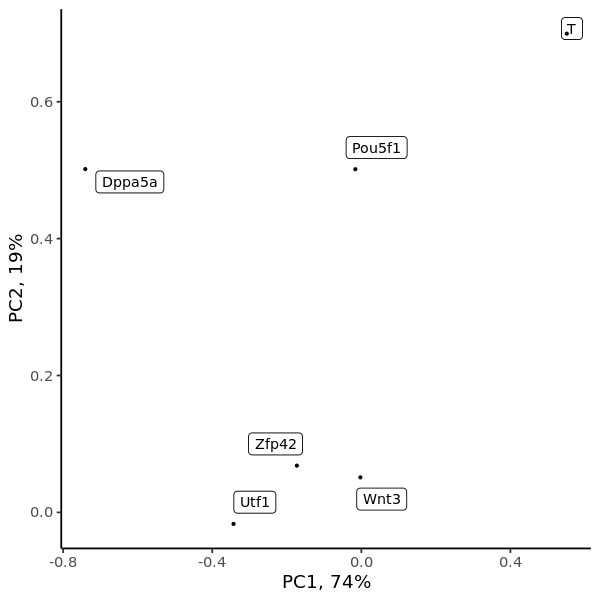

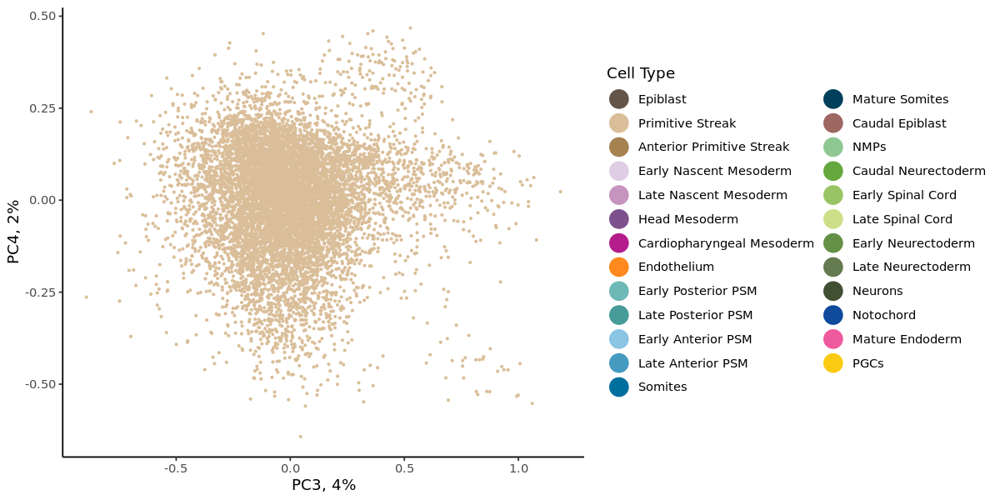

...

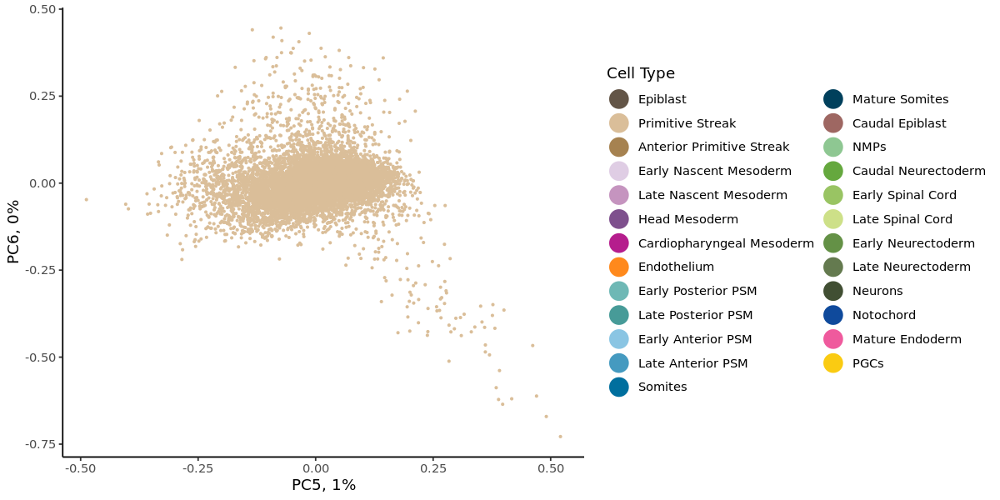

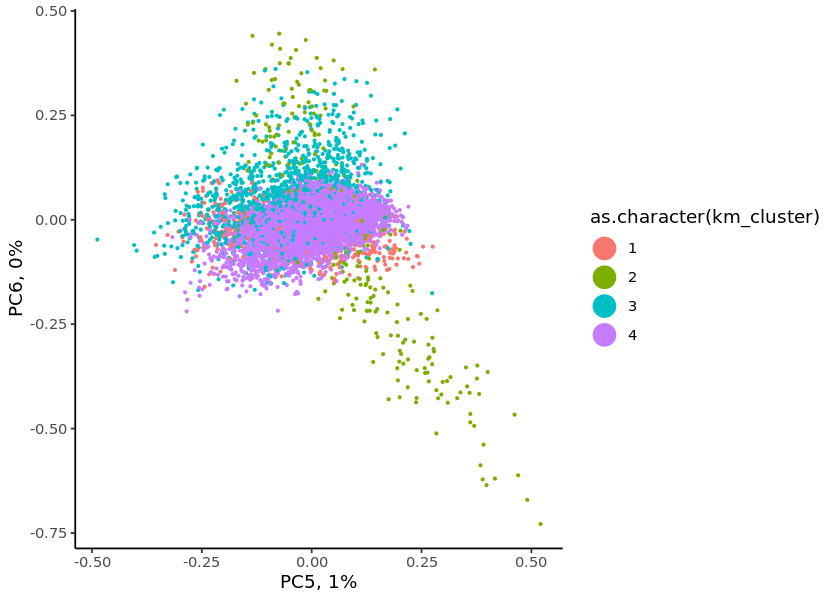

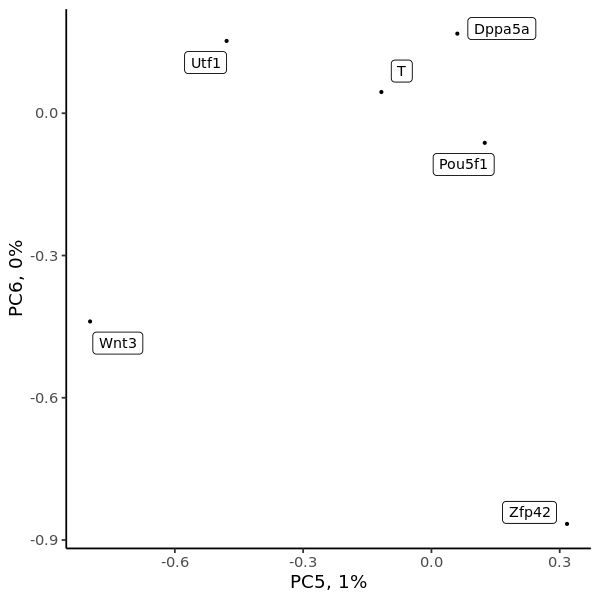

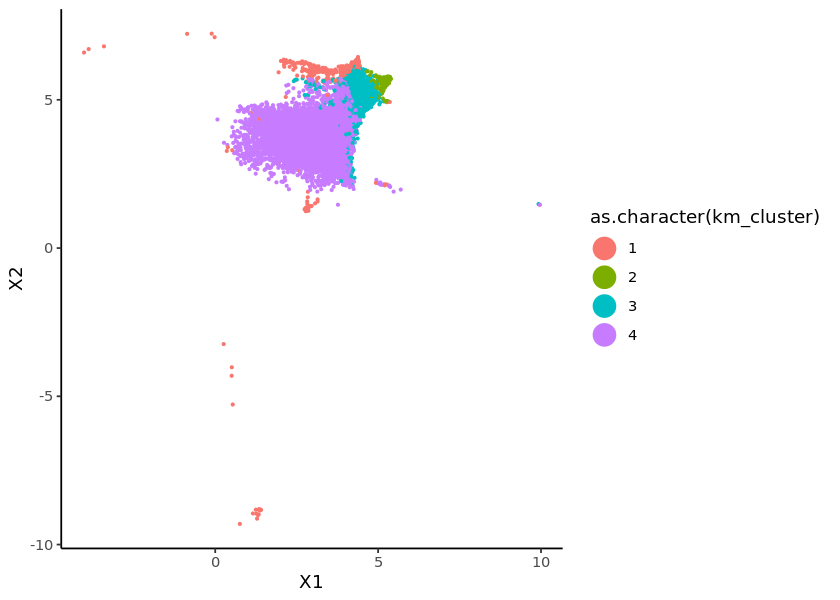

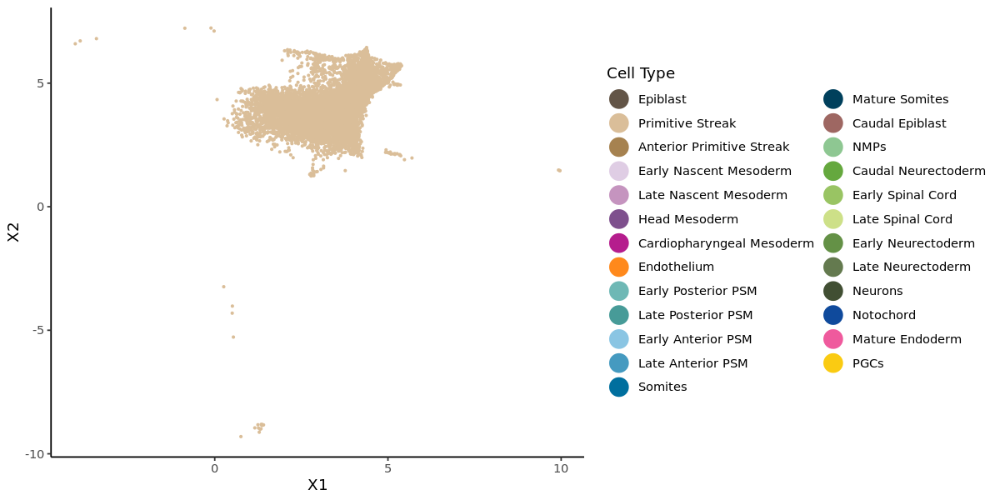

In [5]:
mygenes <- c( 
              'Dppa5a', 'Utf1', 'Zfp42', # PGCs
              #'Thy1', 'Pim2', 'Hes3', # Early Neurectoderm
              #'Pou5f1', 'Hoxc8', 'Hoxb9', 'Hoxaas3', 'Pim2', # Caudal Epiblast
              'Pou5f1', 'T', 'Wnt3' # Primitive Streak
            )

gen_selec <- as.data.table(srat@assays$RNA@meta.features)[symbol %in% unique(mygenes), c("ens_id", "symbol")]

tmp <- as.data.table(srat@meta.data)
tmp2 <- as.matrix(srat@assays[['RNA']]@data[gen_selec$ens_id,])
idx <- split(as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@i+1, rownames(srat@graphs[['RNA_nn']])[as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@j+1])
tmp2 <- lapply(idx, function(x) rowMeans(tmp2[,x])) %>% do.call(rbind, .) %>% as.data.frame
colnames(tmp2) <- gen_selec$symbol
tmp2$cell <- rownames(tmp2)
tmp <- merge(tmp, tmp2, by="cell")

topca <- tmp[(`RNA_snn_res.0.6` %in% c('2'))]
foo <- prcomp( #eval(paste0('~ ', paste(unique(mygenes), collapse=' + '))) ,
              #~ Dppa5a + Utf1 + Zfp42 + Thy1 + Pim2 + Hes3 + Pou5f1 + Hoxc8 + Hoxb9 + Hoxaas3 + T + Wnt3,
              ~ Dppa5a + Utf1 + Zfp42 + Pou5f1 + T + Wnt3,
              data = topca,
              scale = FALSE
             )
PC_var <- round((foo[[1]]**2)/sum(foo[[1]]**2)*100)

tmp2 <- data.table(foo$x)
tmp2$cell <- topca$cell
tmp <- merge(tmp, tmp2, by='cell')

rotation <- as.data.frame(foo$rotation)
rotation$gene <- rownames(rotation)

set.seed(2402)
km <- kmeans(tmp[,c("PC1", "PC2")], centers=4, nstart=10)
tmp$km_cluster <- km$cluster

options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=timepoint)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    scale_colour_manual(values = timepoint_colours, name = "Timepoint") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    #scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC1, y=PC2)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC3, y=PC4, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC3, y=PC4, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC3, y=PC4)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC5, y=PC6, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC5, ",PC_var[5],"%"),
         y=paste0("PC6, ",PC_var[6],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC5, y=PC6, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC5, ",PC_var[5],"%"),
         y=paste0("PC6, ",PC_var[6],"%")) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC5, y=PC6)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC5, ",PC_var[5],"%"),
         y=paste0("PC6, ",PC_var[6],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=X1, y=X2, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=X1, y=X2, colour=cluster)) +
    geom_point(size=0.5) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)

plot_df_joined[cell %in% tmp[km_cluster=='1']$cell, cluster := 'Epiblast']
plot_df_joined[cell %in% tmp[km_cluster=='2']$cell, cluster := 'PGCs']
srat@meta.data$cluster <- NULL
srat@meta.data <- merge(srat@meta.data, plot_df_joined[,c("cell", "cluster")], all.x=TRUE, all.y=FALSE)

Package 'mclust' version 5.4.10
Type 'citation("mclust")' for citing this R package in publications.



---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 2
components: 

 log-likelihood   n df       BIC       ICL
      -107.4186 279 11 -276.7805 -298.6738

Clustering table:
  1   2 
 76 203 

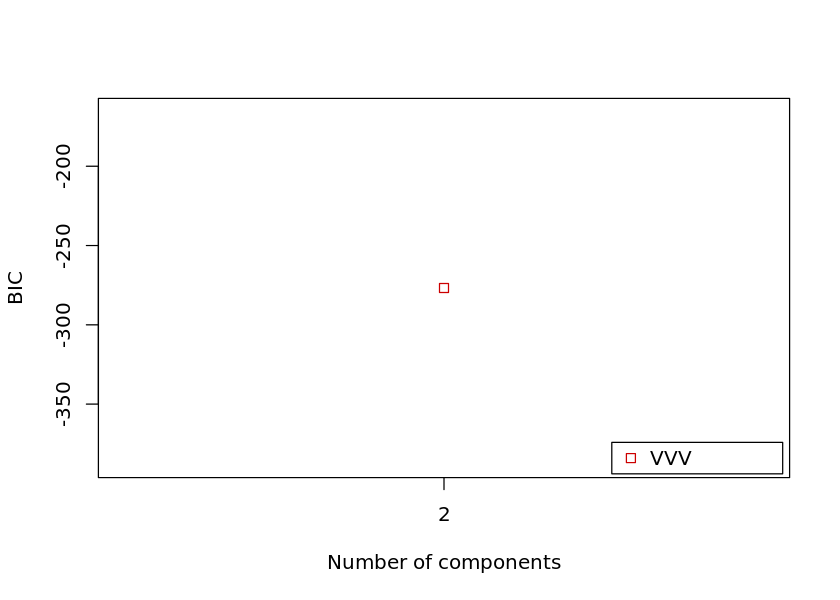

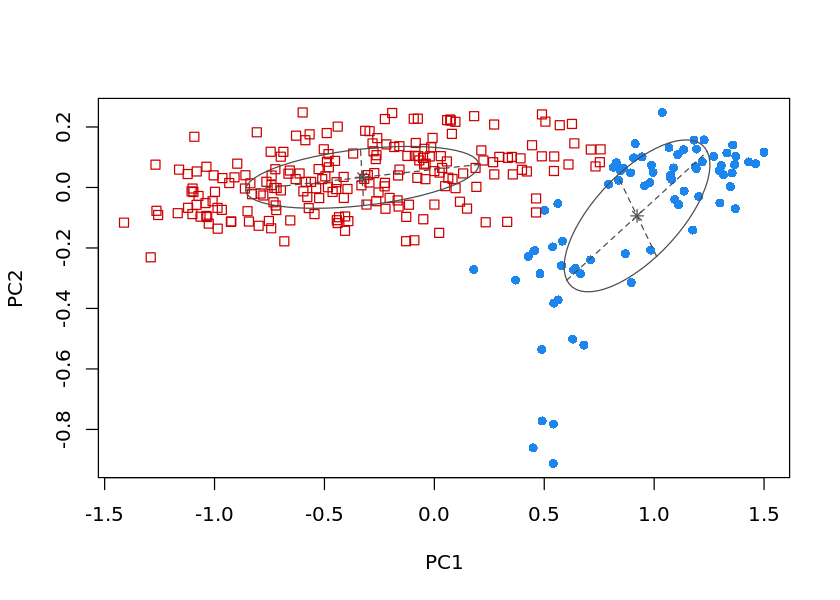

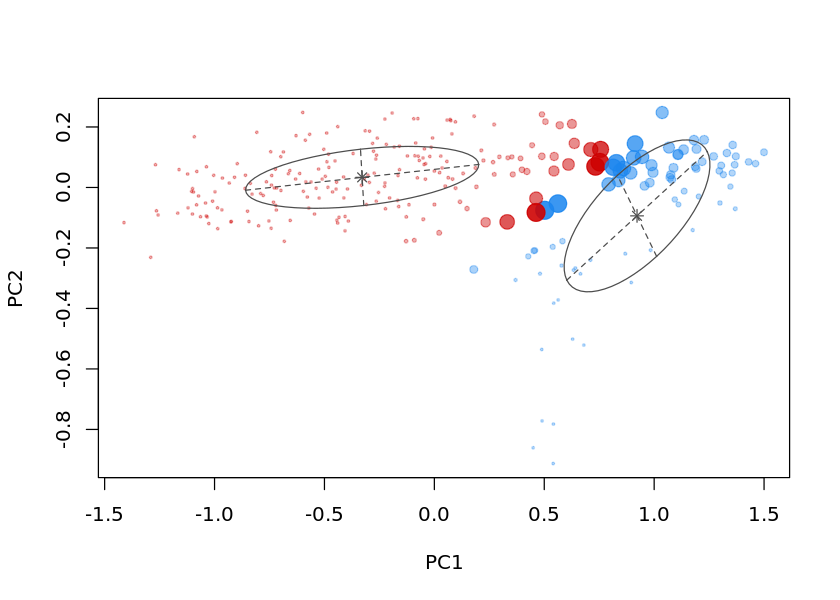

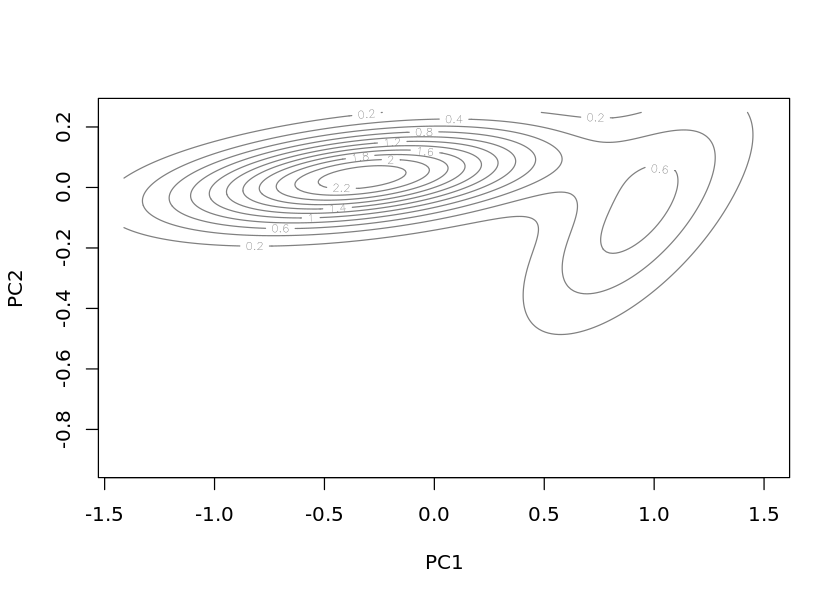

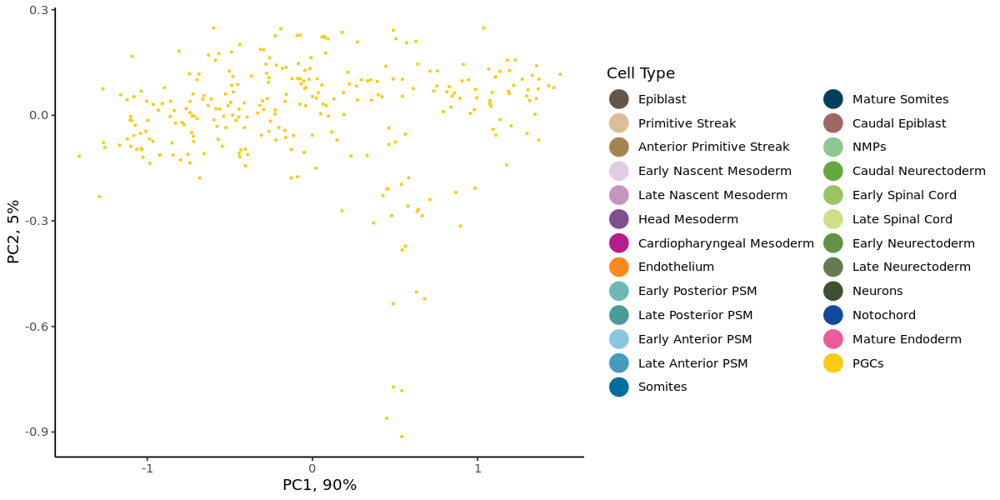

...

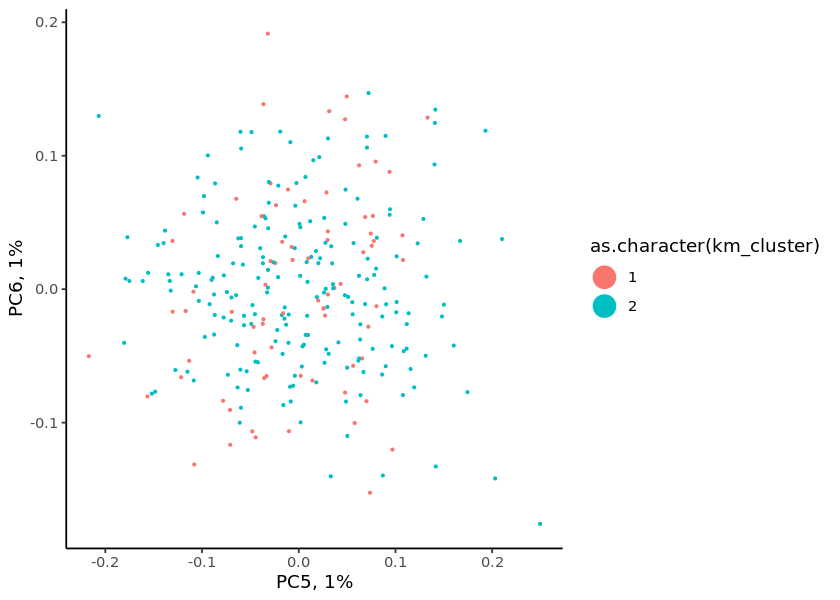

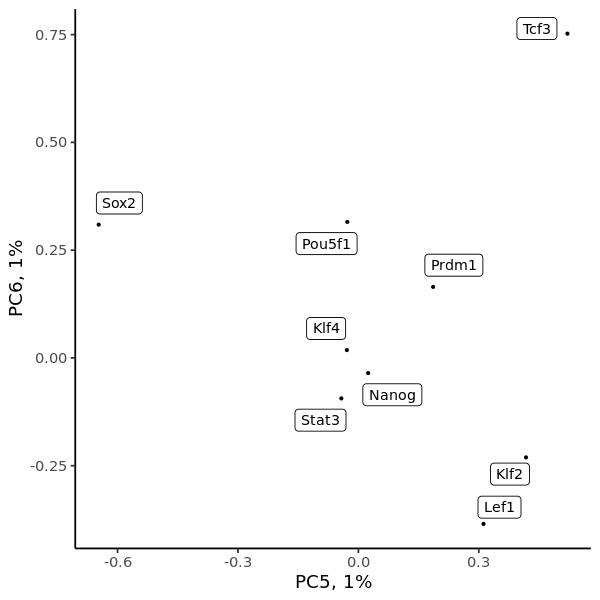

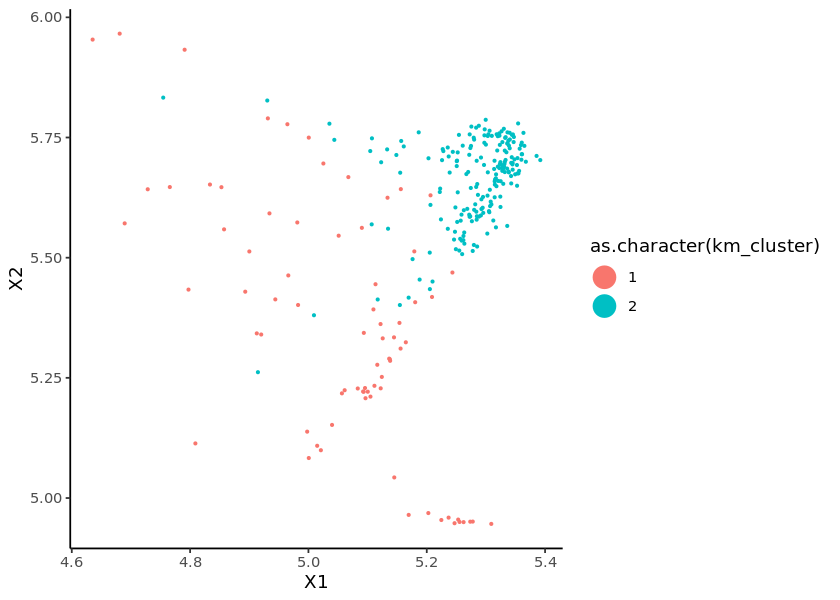

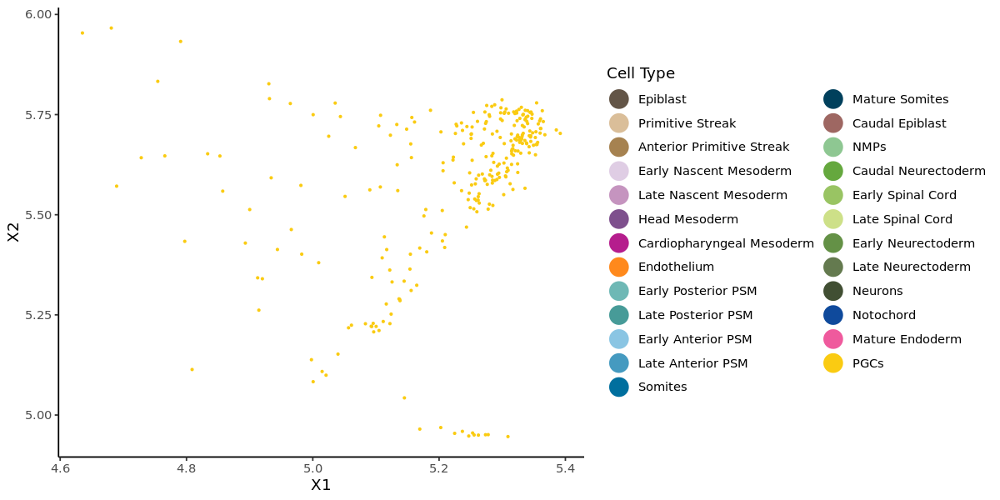

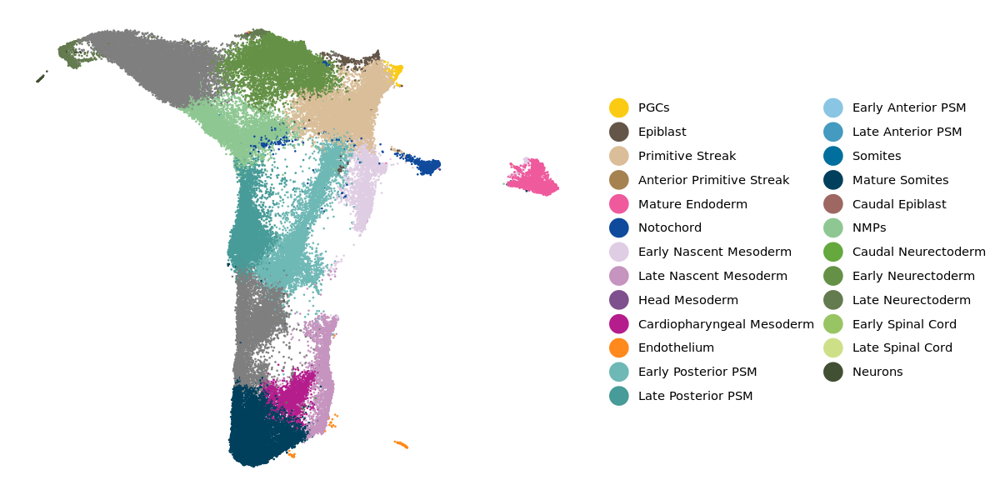

In [6]:
mygenes <- c( 
              'Pou5f1', 'Sox2', 'Klf2', 'Nanog', 'Klf4', 'Stat3', 'Lef1', 'Tcf3', # ESCs
              'Prdm1'# PGCs
            )
#mygenes <- c( 'Pou5f1', 'T', 'Thy1', 'Hes3', 'Hoxc8', 'Hoxb9', 'Hoxaas3' )
#mygenes <- c( 'Pou5f1', 'T', 'Thy1', 'Hes3' )

gen_selec <- as.data.table(srat@assays$RNA@meta.features)[symbol %in% unique(mygenes), c("ens_id", "symbol")]

tmp <- as.data.table(srat@meta.data)
tmp2 <- as.matrix(srat@assays[['RNA']]@data[gen_selec$ens_id,])
idx <- split(as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@i+1, rownames(srat@graphs[['RNA_nn']])[as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@j+1])
tmp2 <- lapply(idx, function(x) rowMeans(tmp2[,x])) %>% do.call(rbind, .) %>% as.data.frame
colnames(tmp2) <- gen_selec$symbol
tmp2$cell <- rownames(tmp2)
tmp <- merge(tmp, tmp2, by="cell")

topca <- tmp[(cluster %in% 'PGCs')]
foo <- prcomp( #eval(paste0('~ ', paste(unique(mygenes), collapse=' + '))) ,
              ~ Pou5f1 + Sox2 + Klf2 + Nanog + Klf4 + Stat3 + Lef1 + Tcf3 + Prdm1,
              #~ Pou5f1 + T + Thy1 + Hes3 + Hoxc8 + Hoxb9 + Hoxaas3,
              #~ Pou5f1 + T + Thy1 + Hes3,
              data = topca,
              scale = FALSE
             )
PC_var <- round((foo[[1]]**2)/sum(foo[[1]]**2)*100)

tmp2 <- data.table(foo$x)
tmp2$cell <- topca$cell
tmp <- merge(tmp, tmp2, by='cell')

rotation <- as.data.frame(foo$rotation)
rotation$gene <- rownames(rotation)

#set.seed(2402)
#km <- kmeans(tmp[,c("PC1", "PC2")], centers=4, nstart=10)
#tmp$km_cluster <- km$cluster
               
library(mclust)
set.seed(2402)
fit <- Mclust(tmp[,c("PC1", "PC2")], G=2, model="VVV")
summary(fit)
options(repr.plot.width=7, repr.plot.height=5)
plot(fit)
tmp$km_cluster <- as.character(fit$classification)

options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=timepoint)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    scale_colour_manual(values = timepoint_colours, name = "Timepoint") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    #scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC1, y=PC2)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC3, y=PC4, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC3, y=PC4, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC3, y=PC4)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC5, y=PC6, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC5, ",PC_var[5],"%"),
         y=paste0("PC6, ",PC_var[6],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC5, y=PC6, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC5, ",PC_var[5],"%"),
         y=paste0("PC6, ",PC_var[6],"%")) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC5, y=PC6)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC5, ",PC_var[5],"%"),
         y=paste0("PC6, ",PC_var[6],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=X1, y=X2, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=X1, y=X2, colour=cluster)) +
    geom_point(size=0.5) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)

options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=cluster)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = cluster_colours[cluster_order], name = "Celltype") +
  #scale_colour_manual(values = cluster_colours, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  theme(line = element_blank(),
        axis.text=element_blank(),
        title = element_blank())
print(p)

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 4
components: 

 log-likelihood    n df       BIC      ICL
      -19166.56 7152 23 -38537.24 -40132.8

Clustering table:
   1    2    3    4 
2284 1464 2340 1064 

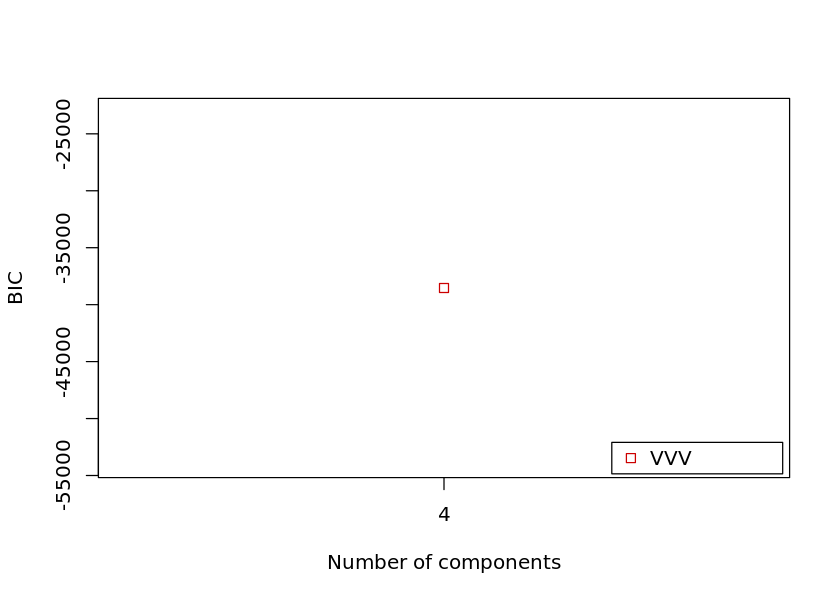

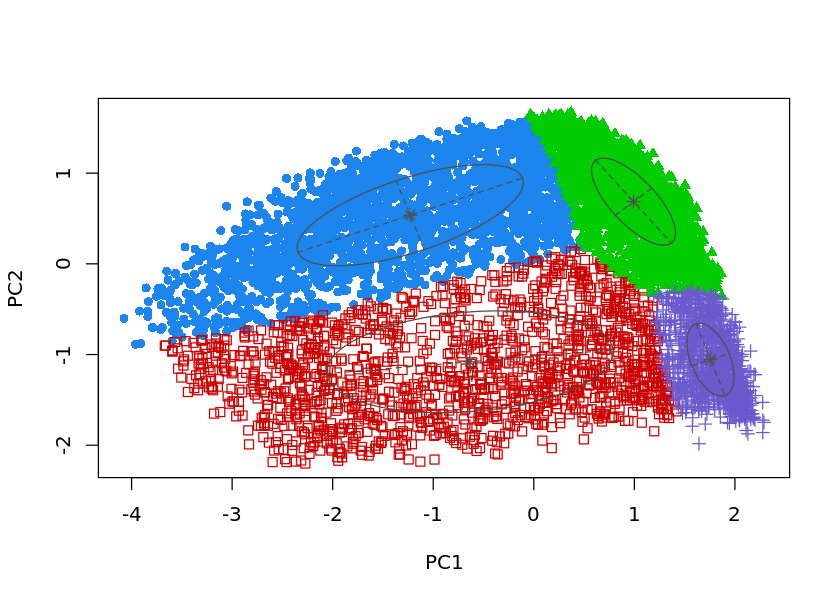

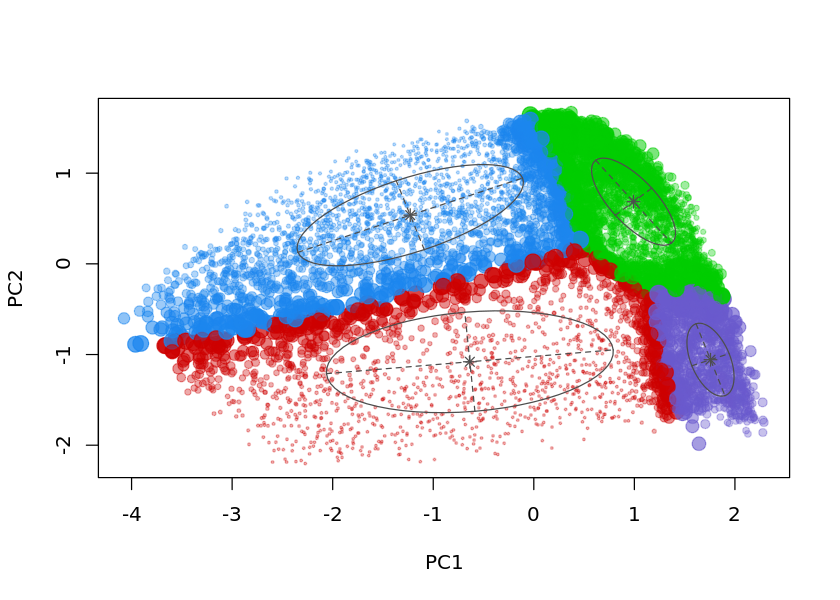

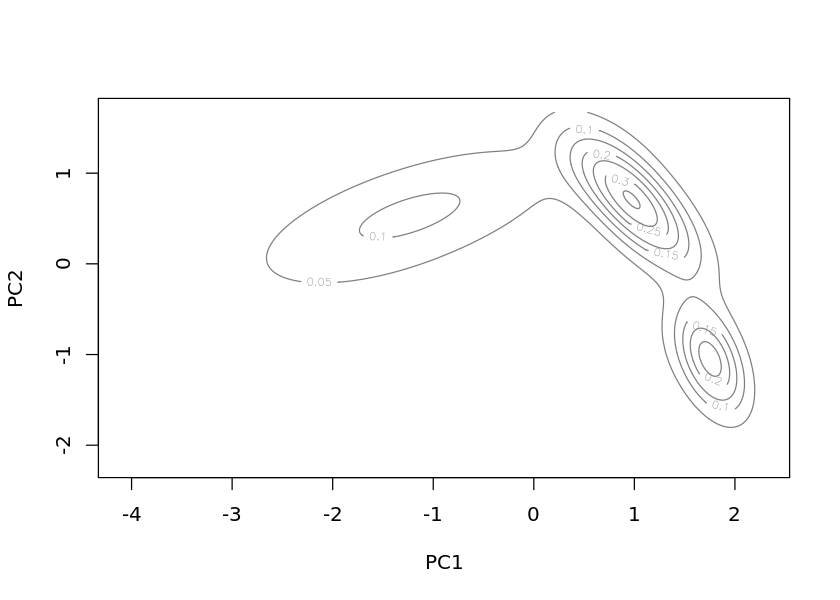

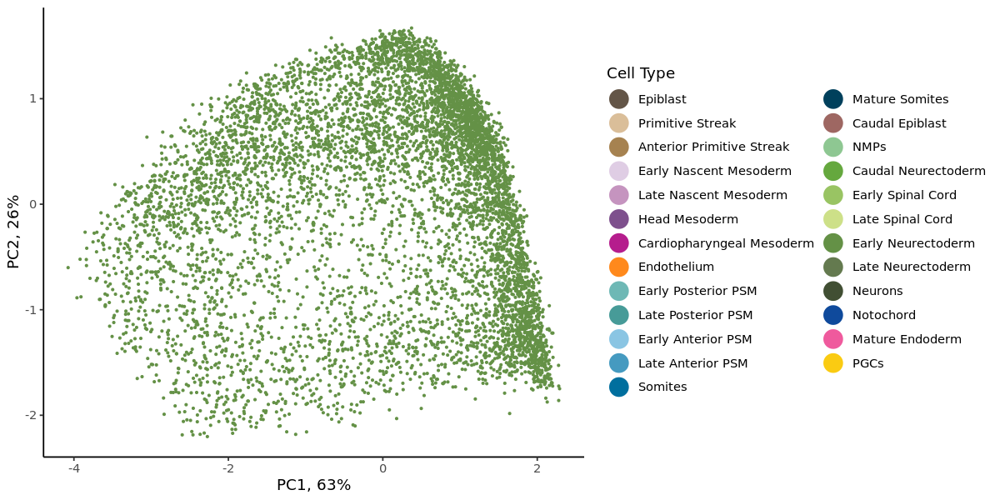

...

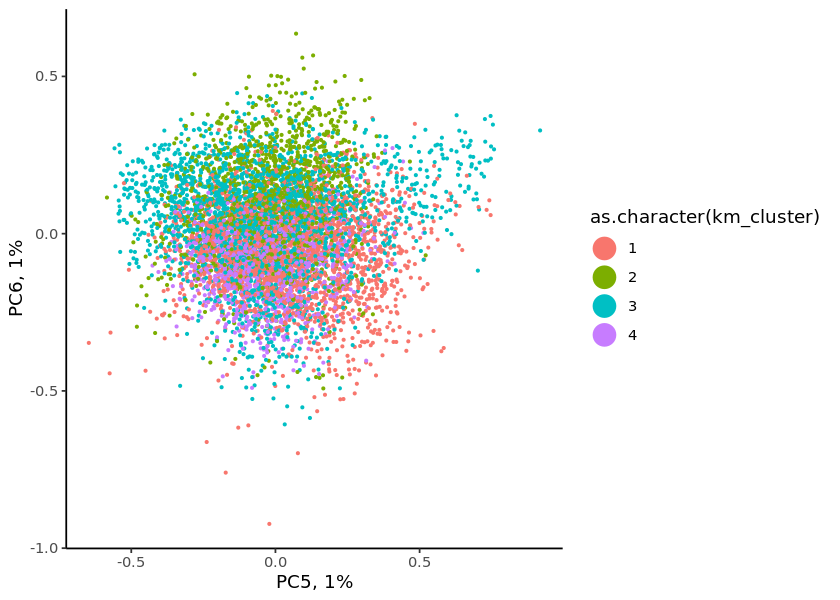

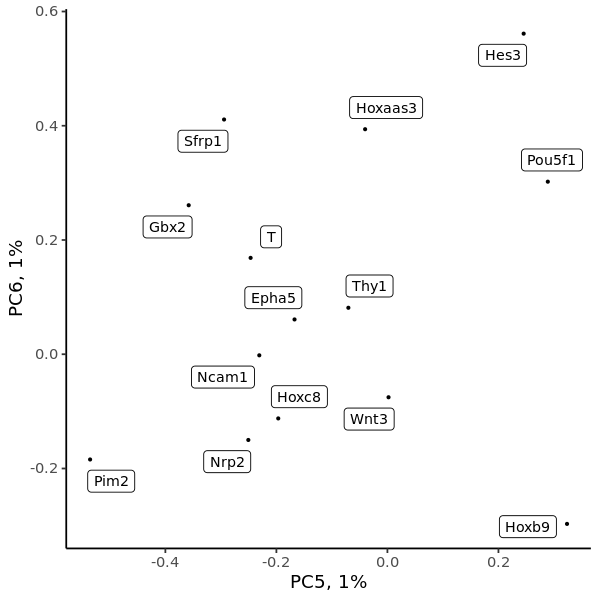

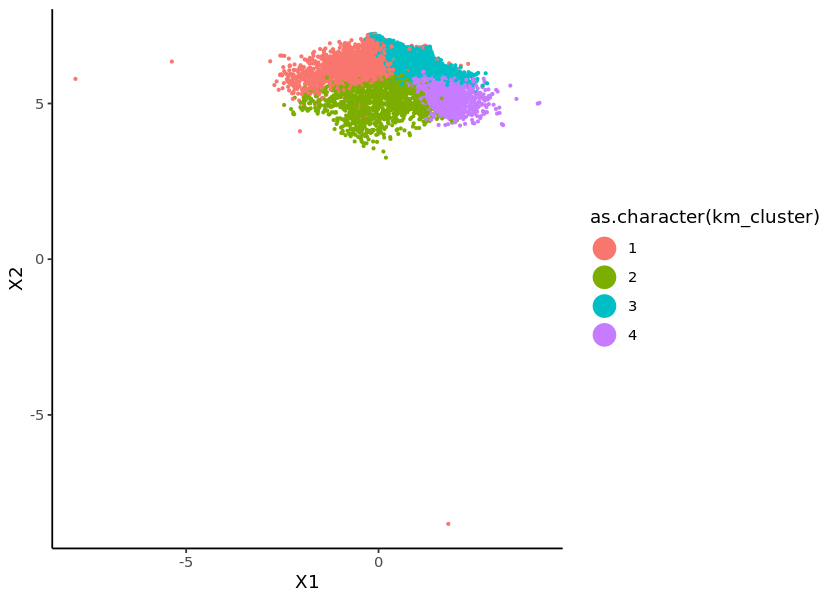

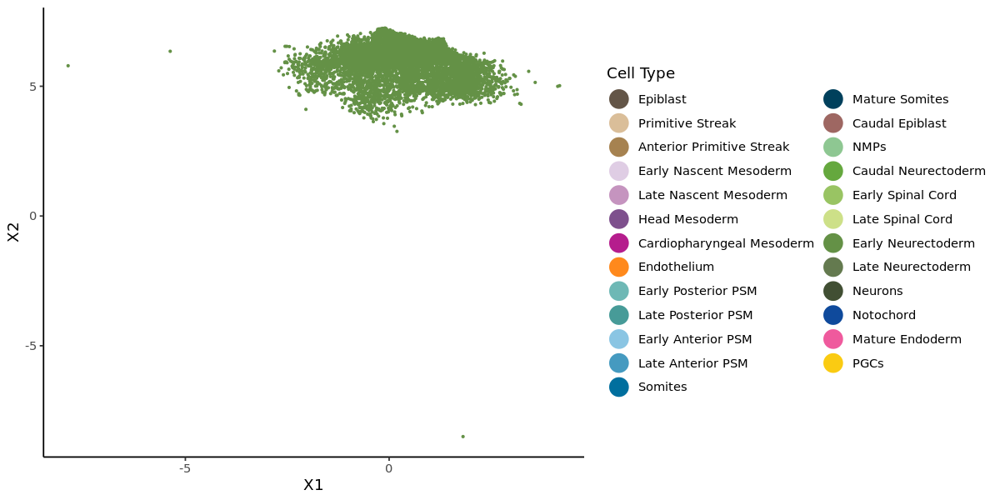

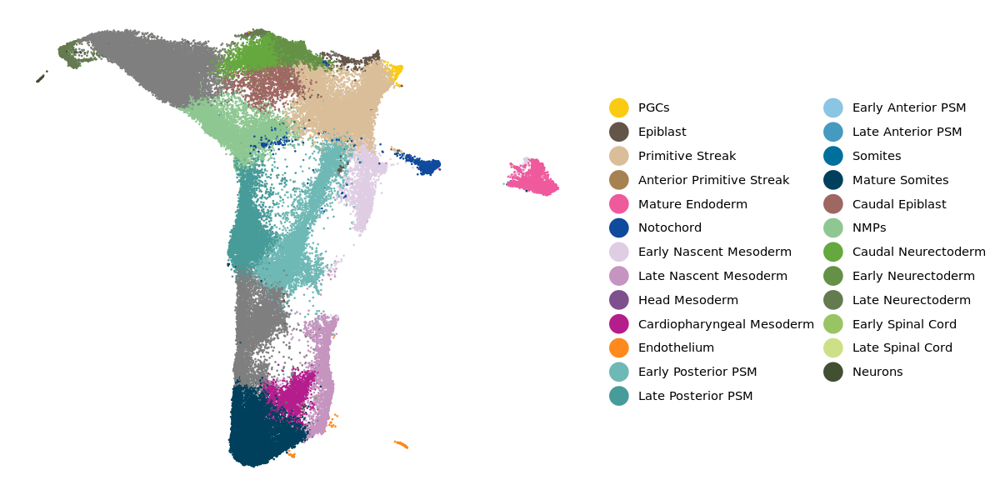

In [7]:
mygenes <- c( 
              'Thy1', 'Hes3', 'Nrp2', 'Epha5', 'Gbx2', 'Sfrp1', 'Ncam1', # Early Neurectoderm
              'Pou5f1', 'Hoxc8', 'Hoxb9', 'Hoxaas3', 'Pim2', # Caudal Epiblast
              'Pou5f1', 'T', 'Wnt3' # Primitive Streak
            )
#mygenes <- c( 'Pou5f1', 'T', 'Thy1', 'Hes3', 'Hoxc8', 'Hoxb9', 'Hoxaas3' )
#mygenes <- c( 'Pou5f1', 'T', 'Thy1', 'Hes3' )

gen_selec <- as.data.table(srat@assays$RNA@meta.features)[symbol %in% unique(mygenes), c("ens_id", "symbol")]

tmp <- as.data.table(srat@meta.data)
tmp2 <- as.matrix(srat@assays[['RNA']]@data[gen_selec$ens_id,])
idx <- split(as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@i+1, rownames(srat@graphs[['RNA_nn']])[as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@j+1])
tmp2 <- lapply(idx, function(x) rowMeans(tmp2[,x])) %>% do.call(rbind, .) %>% as.data.frame
colnames(tmp2) <- gen_selec$symbol
tmp2$cell <- rownames(tmp2)
tmp <- merge(tmp, tmp2, by="cell")

topca <- tmp[(cluster %in% 'Early Neurectoderm')]
foo <- prcomp( #eval(paste0('~ ', paste(unique(mygenes), collapse=' + '))) ,
              ~ Thy1 + Hes3 + Nrp2 + Epha5 + Gbx2 + Sfrp1 + Ncam1 + Pou5f1 + Hoxc8 + Hoxb9 + Hoxaas3 + Pim2 + T + Wnt3,
              #~ Pou5f1 + T + Thy1 + Hes3 + Hoxc8 + Hoxb9 + Hoxaas3,
              #~ Pou5f1 + T + Thy1 + Hes3,
              data = topca,
              scale = FALSE
             )
PC_var <- round((foo[[1]]**2)/sum(foo[[1]]**2)*100)

tmp2 <- data.table(foo$x)
tmp2$cell <- topca$cell
tmp <- merge(tmp, tmp2, by='cell')

rotation <- as.data.frame(foo$rotation)
rotation$gene <- rownames(rotation)

#set.seed(2402)
#km <- kmeans(tmp[,c("PC1", "PC2")], centers=4, nstart=10)
#tmp$km_cluster <- km$cluster
               
library(mclust)
set.seed(2402)
fit <- Mclust(tmp[,c("PC1", "PC2")], G=4, model="VVV")
summary(fit)
options(repr.plot.width=7, repr.plot.height=5)
plot(fit)
tmp$km_cluster <- as.character(fit$classification)

options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    #scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC1, y=PC2)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC3, y=PC4, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC3, y=PC4, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC3, y=PC4)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC5, y=PC6, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC5, ",PC_var[5],"%"),
         y=paste0("PC6, ",PC_var[6],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC5, y=PC6, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC5, ",PC_var[5],"%"),
         y=paste0("PC6, ",PC_var[6],"%")) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC5, y=PC6)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC5, ",PC_var[5],"%"),
         y=paste0("PC6, ",PC_var[6],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=X1, y=X2, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=X1, y=X2, colour=cluster)) +
    geom_point(size=0.5) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)

plot_df_joined[cell %in% tmp[km_cluster=='1']$cell, cluster := 'Caudal Neurectoderm']
plot_df_joined[cell %in% tmp[km_cluster=='2']$cell, cluster := 'Caudal Epiblast']
plot_df_joined[cell %in% tmp[km_cluster=='4']$cell, cluster := 'Primitive Streak']
srat@meta.data$cluster <- NULL
srat@meta.data <- merge(srat@meta.data, plot_df_joined[,c("cell", "cluster")], all.x=TRUE, all.y=FALSE)

options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=cluster)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = cluster_colours[cluster_order], name = "Celltype") +
  #scale_colour_manual(values = cluster_colours, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  theme(line = element_blank(),
        axis.text=element_blank(),
        title = element_blank())
print(p)

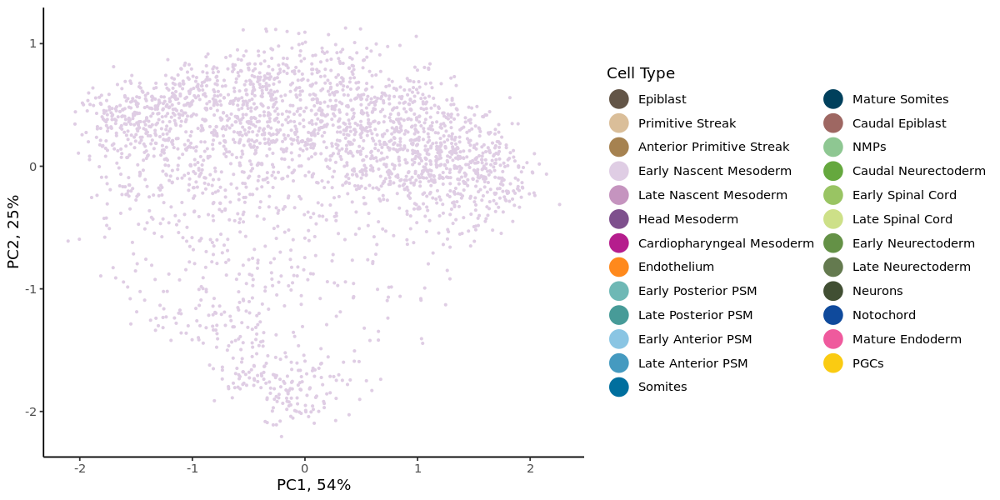

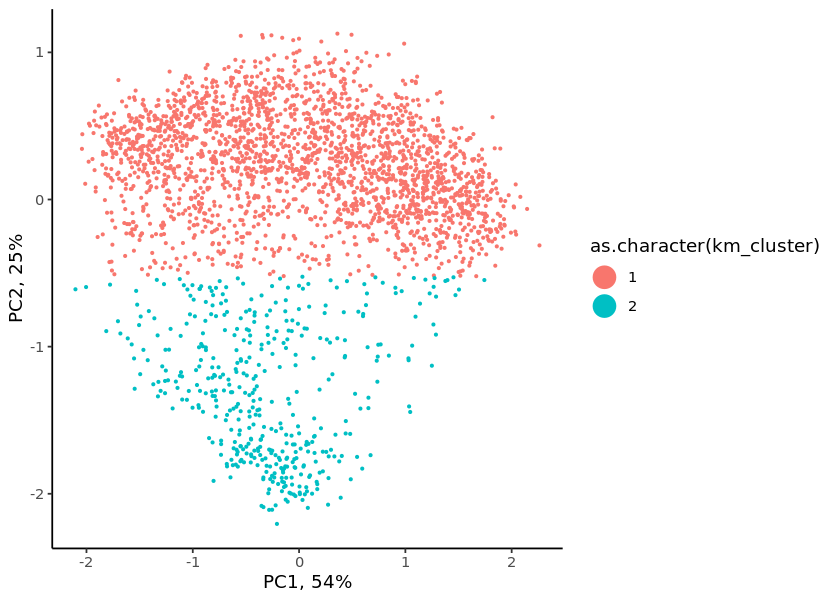

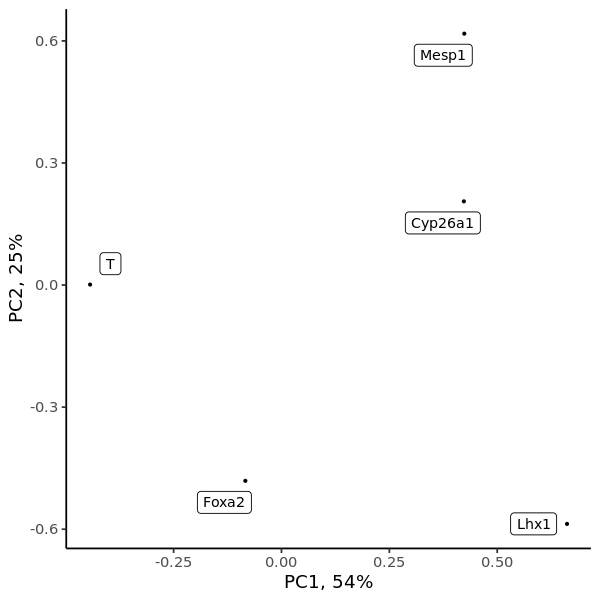

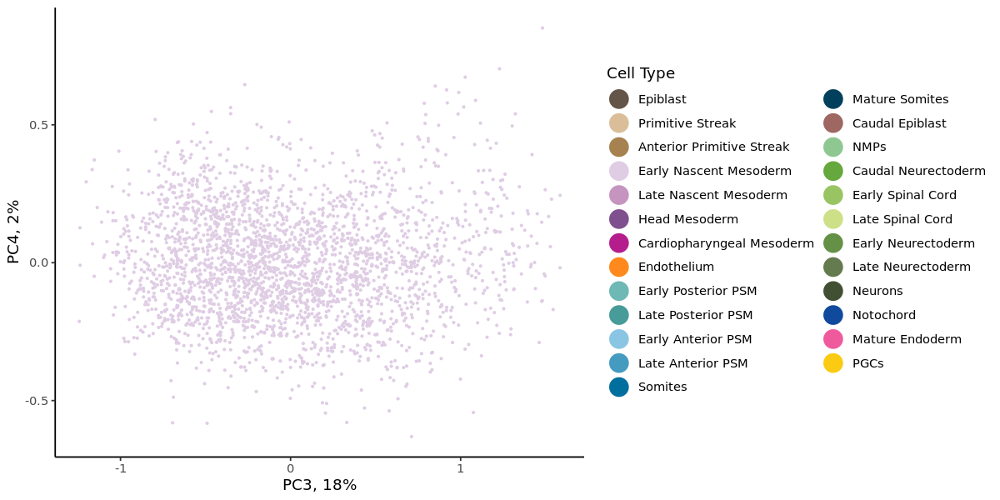

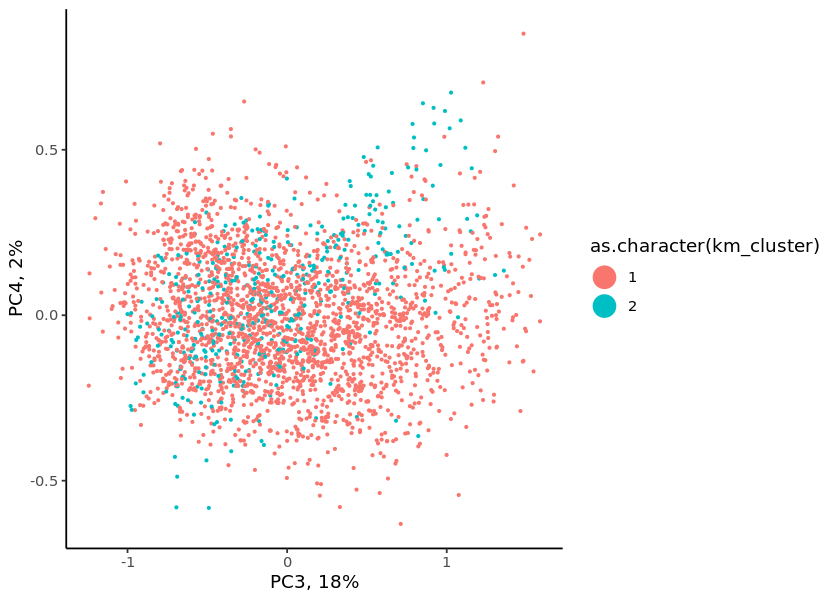

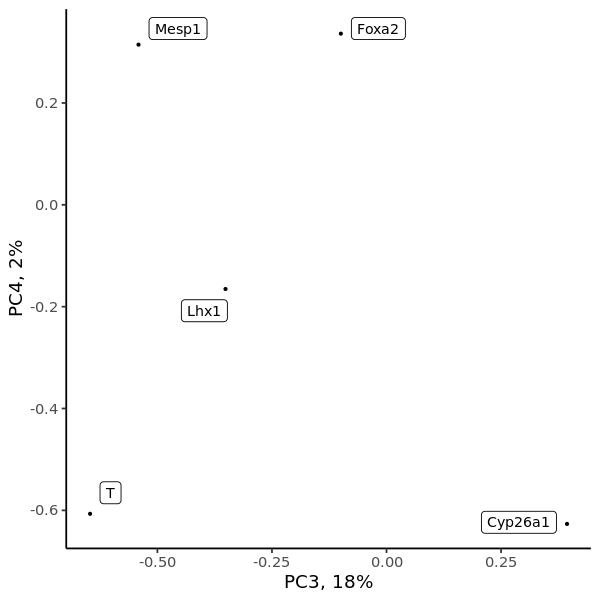

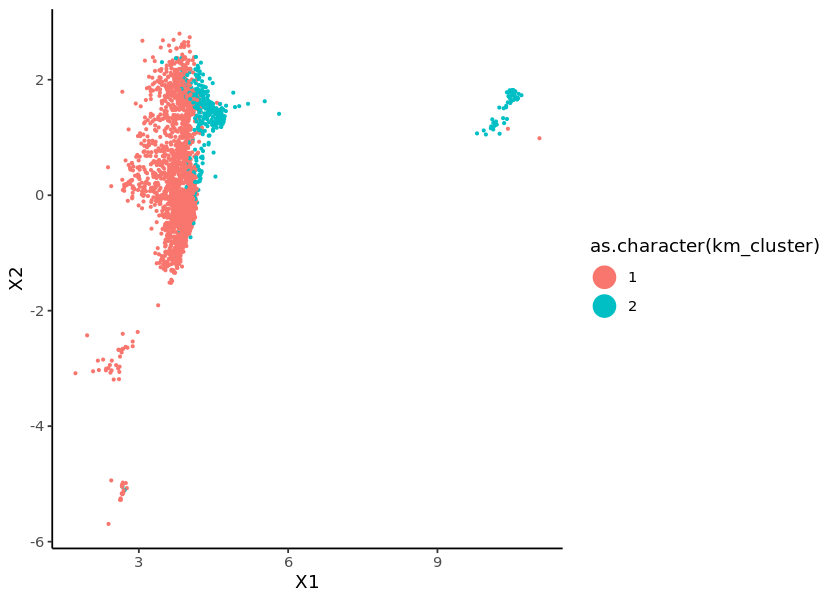

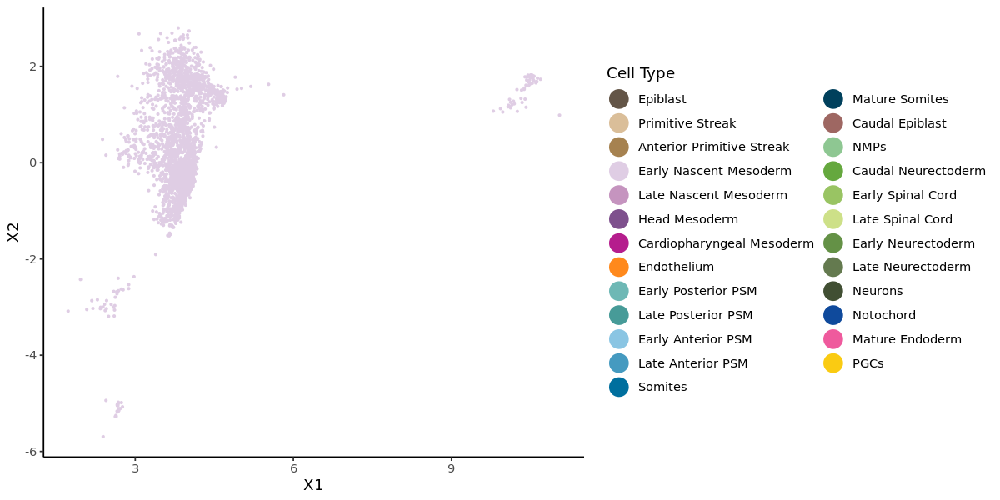

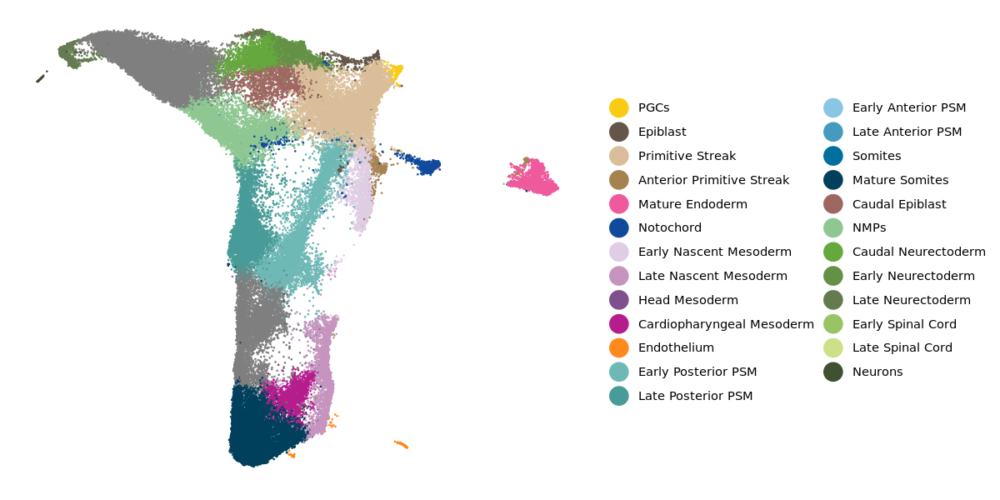

In [8]:
mygenes <- c( 
              #'Pou5f1', 'T', 'Wnt3', # Primitive Streak
              'T', 'Foxa2', # Anterior Primitive Streak
              'Cyp26a1', 'Lhx1', 'Mesp1' # Nascent Meso
            )

gen_selec <- as.data.table(srat@assays$RNA@meta.features)[symbol %in% unique(mygenes), c("ens_id", "symbol")]

tmp <- as.data.table(srat@meta.data)
tmp2 <- as.matrix(srat@assays[['RNA']]@data[gen_selec$ens_id,])
idx <- split(as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@i+1, rownames(srat@graphs[['RNA_nn']])[as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@j+1])
tmp2 <- lapply(idx, function(x) rowMeans(tmp2[,x])) %>% do.call(rbind, .) %>% as.data.frame
colnames(tmp2) <- gen_selec$symbol
tmp2$cell <- rownames(tmp2)
tmp <- merge(tmp, tmp2, by="cell")

topca <- tmp[(`RNA_snn_res.0.6` %in% c('10'))]
foo <- prcomp( #eval(paste0('~ ', paste(unique(mygenes), collapse=' + '))) ,
              ~ T + Foxa2 + Cyp26a1 + Lhx1 + Mesp1,
              data = topca,
              scale = FALSE
             )
PC_var <- round((foo[[1]]**2)/sum(foo[[1]]**2)*100)

tmp2 <- data.table(foo$x)
tmp2$cell <- topca$cell
tmp <- merge(tmp, tmp2, by='cell')

rotation <- as.data.frame(foo$rotation)
rotation$gene <- rownames(rotation)

set.seed(2402)
km <- kmeans(tmp[,c("PC2")], centers=2, nstart=5)
tmp$km_cluster <- km$cluster

options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    #scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC1, y=PC2)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC3, y=PC4, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC3, y=PC4, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC3, y=PC4)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
               
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=X1, y=X2, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=X1, y=X2, colour=cluster)) +
    geom_point(size=0.5) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)

plot_df_joined[cell %in% tmp[km_cluster=='2']$cell, cluster := 'Anterior Primitive Streak']
srat@meta.data$cluster <- NULL
srat@meta.data <- merge(srat@meta.data, plot_df_joined[,c("cell", "cluster")], all.x=TRUE, all.y=FALSE)
               
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=cluster)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = cluster_colours[cluster_order], name = "Celltype") +
  #scale_colour_manual(values = cluster_colours, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  theme(line = element_blank(),
        axis.text=element_blank(),
        title = element_blank())
print(p)

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 2
components: 

 log-likelihood    n df       BIC       ICL
      -5346.527 3418 11 -10782.56 -10996.48

Clustering table:
   1    2 
1804 1614 

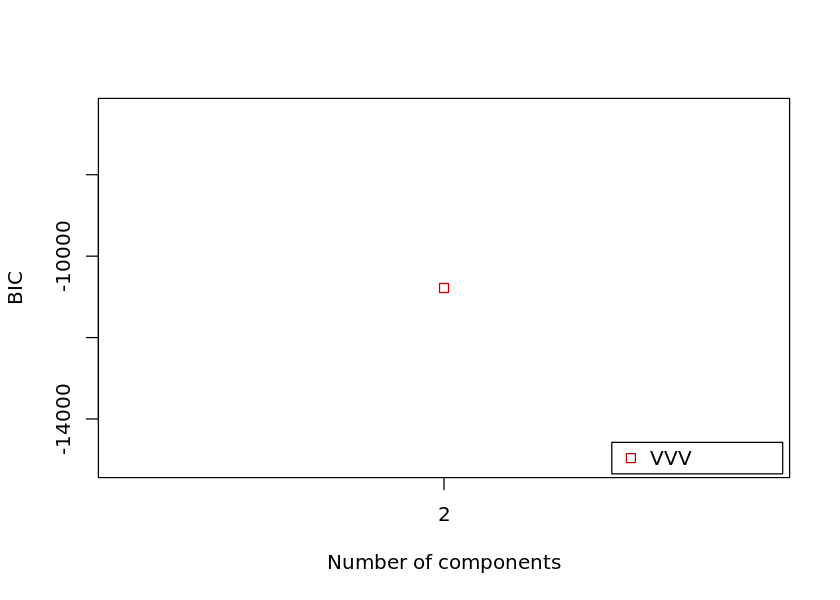

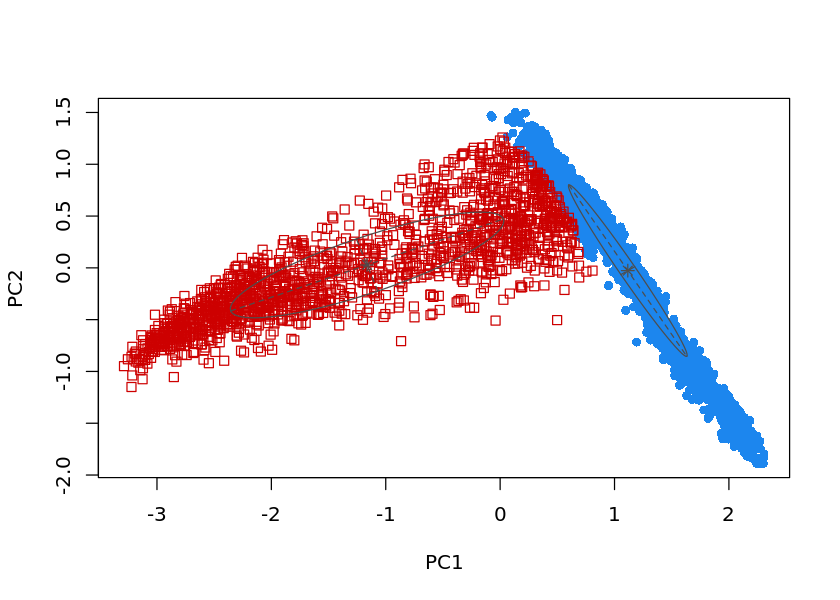

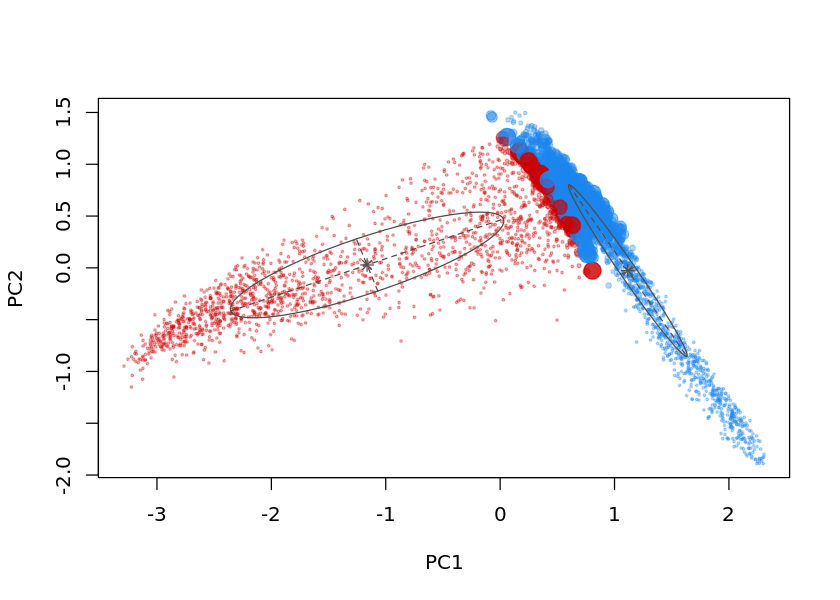

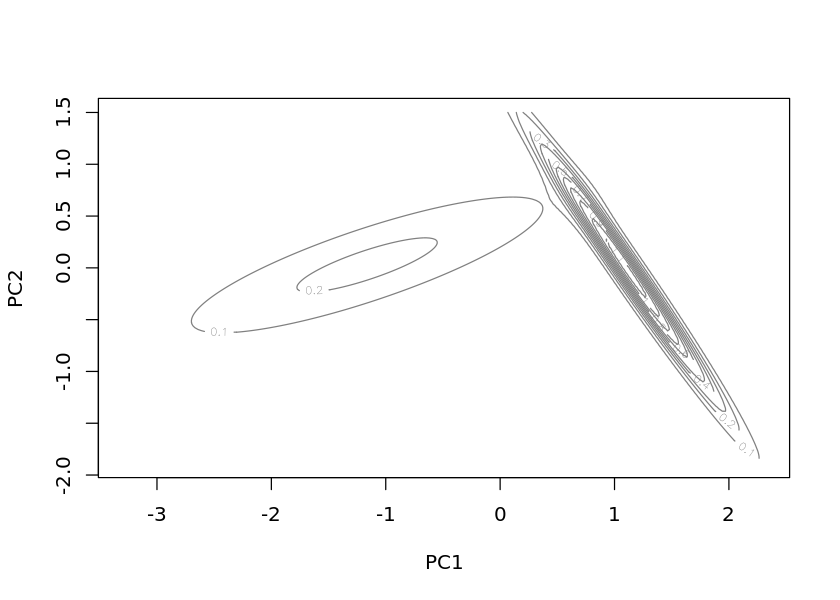

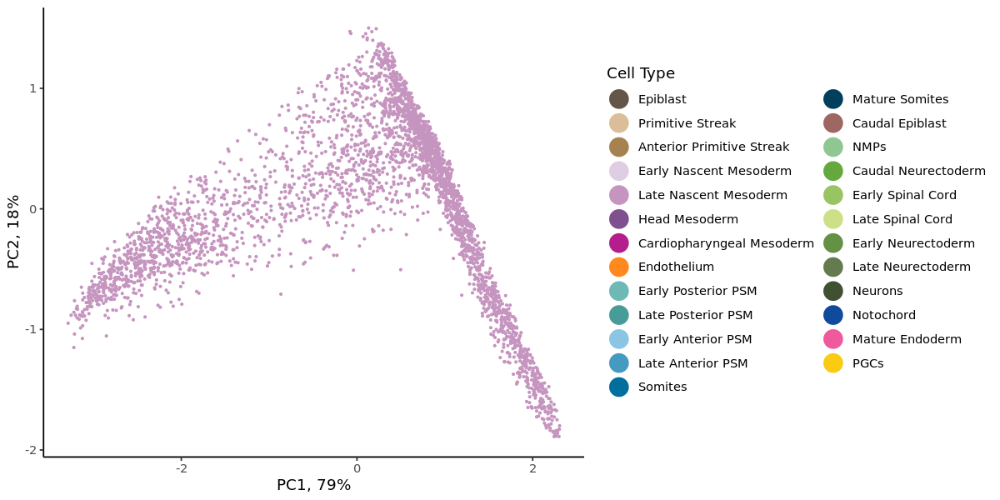

...

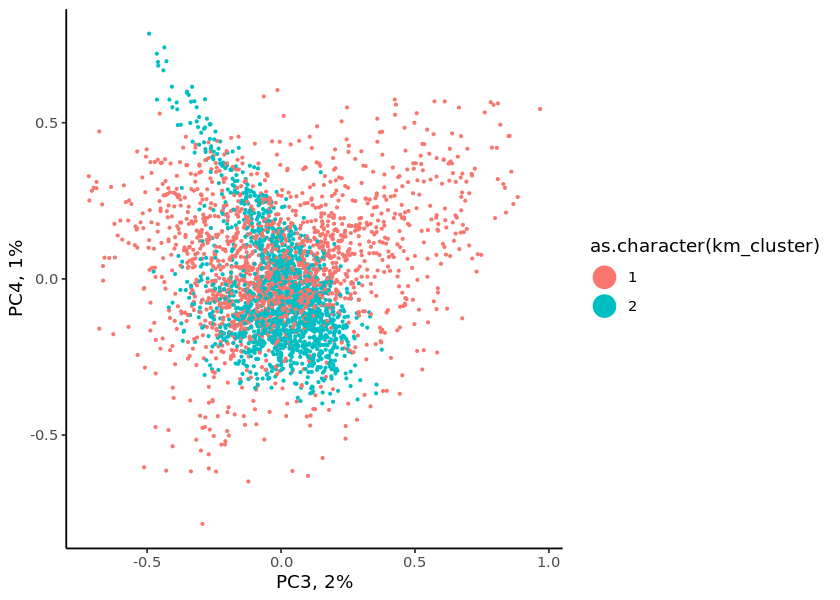

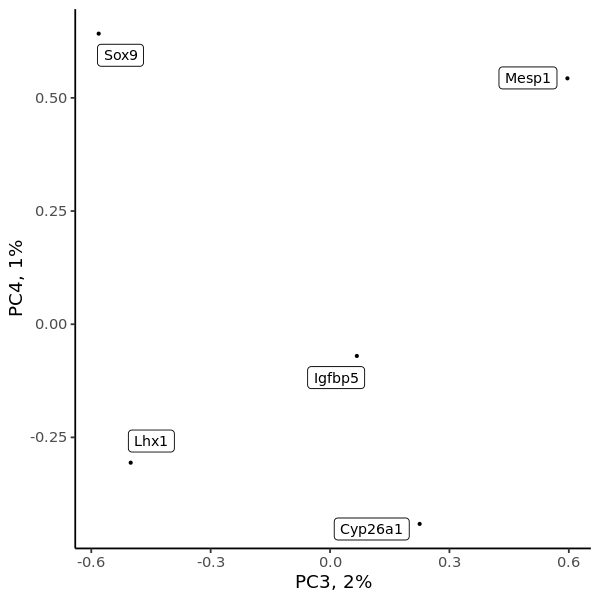

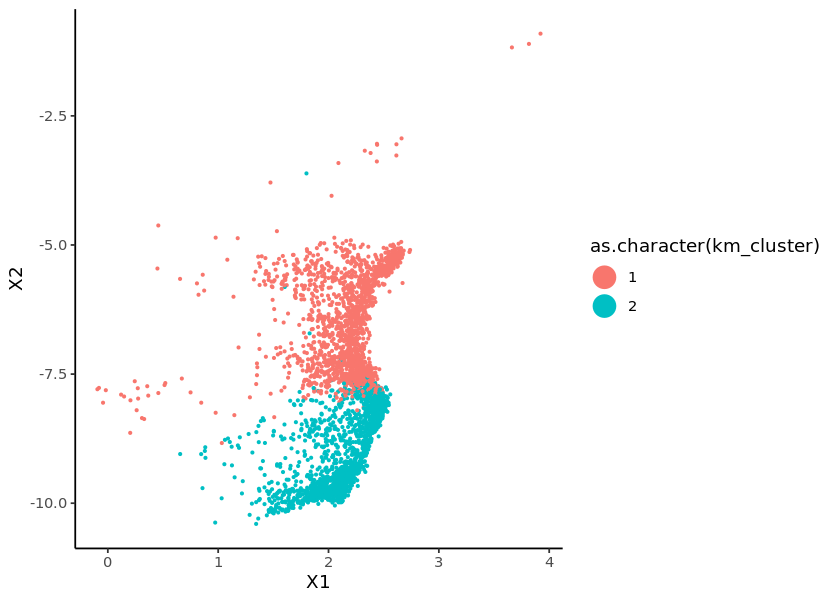

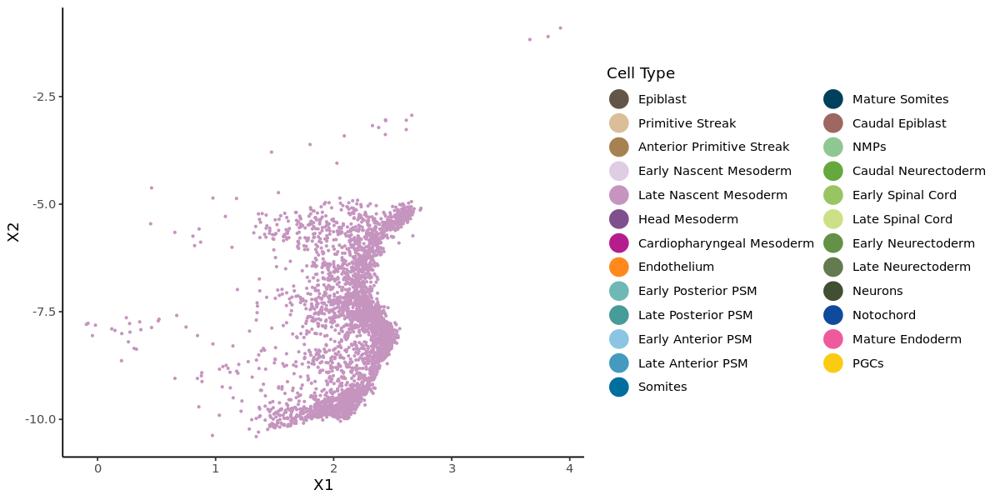

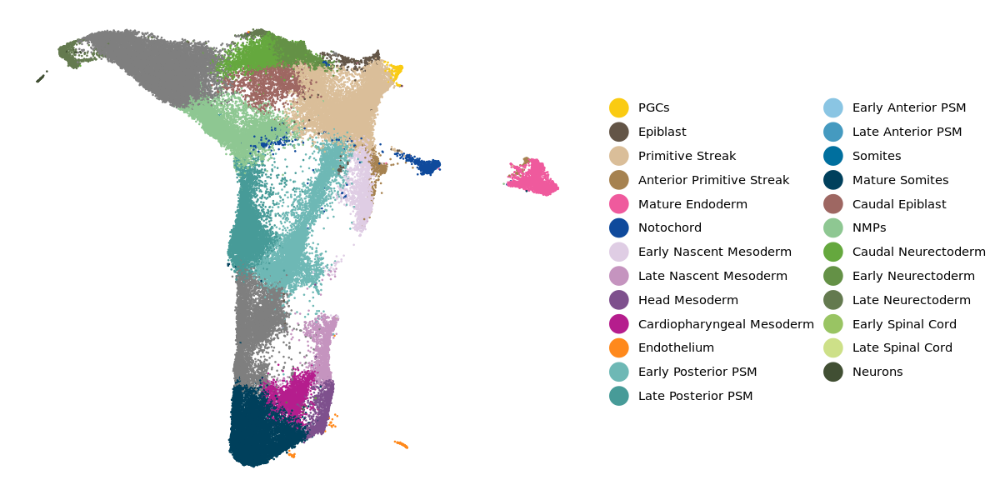

In [9]:
mygenes <- c( 
              'Cyp26a1', 'Lhx1', 'Mesp1', # Nascent Mesoderm
              'Igfbp5', 'Sox9' # Head Mesoderm
            )

gen_selec <- as.data.table(srat@assays$RNA@meta.features)[symbol %in% unique(mygenes), c("ens_id", "symbol")]

tmp <- as.data.table(srat@meta.data)
tmp2 <- as.matrix(srat@assays[['RNA']]@data[gen_selec$ens_id,])
idx <- split(as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@i+1, rownames(srat@graphs[['RNA_nn']])[as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@j+1])
tmp2 <- lapply(idx, function(x) rowMeans(tmp2[,x])) %>% do.call(rbind, .) %>% as.data.frame
colnames(tmp2) <- gen_selec$symbol
tmp2$cell <- rownames(tmp2)
tmp <- merge(tmp, tmp2, by="cell")

topca <- tmp[(`RNA_snn_res.0.6` %in% c('8'))]
foo <- prcomp( #eval(paste0('~ ', paste(unique(mygenes), collapse=' + '))) ,
              ~ Cyp26a1 + Lhx1 + Mesp1 + Igfbp5 + Sox9,
              data = topca,
              scale = FALSE
             )
PC_var <- round((foo[[1]]**2)/sum(foo[[1]]**2)*100)

tmp2 <- data.table(foo$x)
tmp2$cell <- topca$cell
tmp <- merge(tmp, tmp2, by='cell')

rotation <- as.data.frame(foo$rotation)
rotation$gene <- rownames(rotation)

#set.seed(2402)
#km <- kmeans(tmp[,c("PC1", "PC2")], centers=4, nstart=10)
#tmp$km_cluster <- km$cluster
               
library(mclust)
set.seed(2402)
fit <- Mclust(tmp[,c("PC1", "PC2")], G=2, model="VVV")
summary(fit)
options(repr.plot.width=7, repr.plot.height=5)
plot(fit)
tmp$km_cluster <- as.character(fit$classification)

options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    #scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC1, y=PC2)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC3, y=PC4, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC3, y=PC4, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC3, y=PC4)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC3, ",PC_var[3],"%"),
         y=paste0("PC4, ",PC_var[4],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
               
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=X1, y=X2, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=X1, y=X2, colour=cluster)) +
    geom_point(size=0.5) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)

plot_df_joined[cell %in% tmp[km_cluster=='2']$cell, cluster := 'Head Mesoderm']
srat@meta.data$cluster <- NULL
srat@meta.data <- merge(srat@meta.data, plot_df_joined[,c("cell", "cluster")], all.x=TRUE, all.y=FALSE)
               
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=cluster)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = cluster_colours[cluster_order], name = "Celltype") +
  #scale_colour_manual(values = cluster_colours, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  theme(line = element_blank(),
        axis.text=element_blank(),
        title = element_blank())
print(p)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13656
Number of edges: 936491

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8534
Number of communities: 2
Elapsed time: 5 seconds


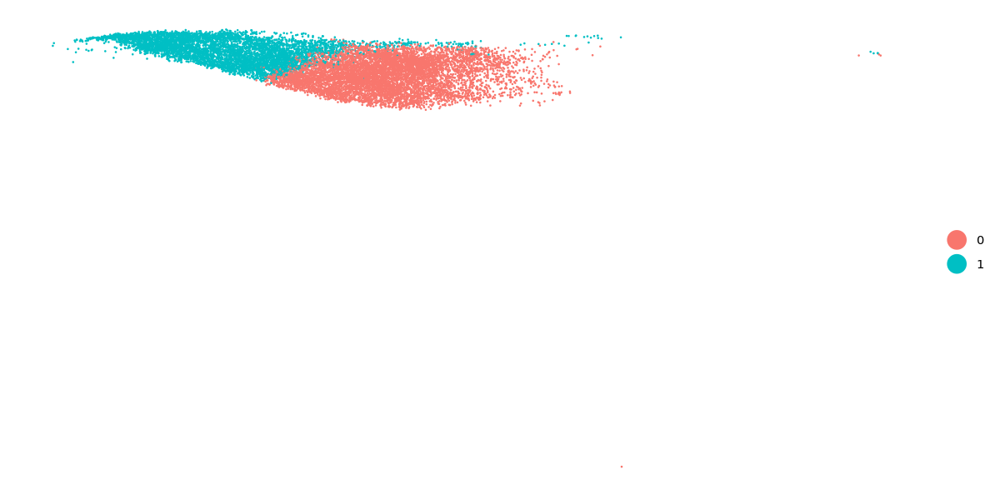

In [10]:
rownames(srat@meta.data) <- srat@meta.data$cell
srat@meta.data <- srat@meta.data[Cells(srat),]
srat_sub <- subset(srat, subset = (cluster  == 'Spinal Cord'))
srat_sub <- FindNeighbors(srat_sub, dims = 1:50, k.param = 30, reduction = "pca")
srat_sub <- FindClusters(srat_sub, resolution = 0.2, random.seed=0)
p <- ggplot(data=srat_sub@meta.data, mapping = aes(x=X1, y=X2, colour=`RNA_snn_res.0.2`)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  #scale_colour_manual(values = cluster_colours[cluster_order], name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  theme(line = element_blank(),
        axis.text=element_blank(),
        title = element_blank())
print(p)


plot_df_joined[cell %in% srat_sub@meta.data$cell[srat_sub@meta.data$`RNA_snn_res.0.2` == 0], cluster := 'Early Spinal Cord']
plot_df_joined[cell %in% srat_sub@meta.data$cell[srat_sub@meta.data$`RNA_snn_res.0.2` == 1], cluster := 'Late Spinal Cord']
srat@meta.data$cluster <- NULL
srat@meta.data <- merge(srat@meta.data, plot_df_joined[,c("cell", "cluster")], all.x=TRUE, all.y=FALSE)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6290
Number of edges: 470302

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8102
Number of communities: 3
Elapsed time: 1 seconds


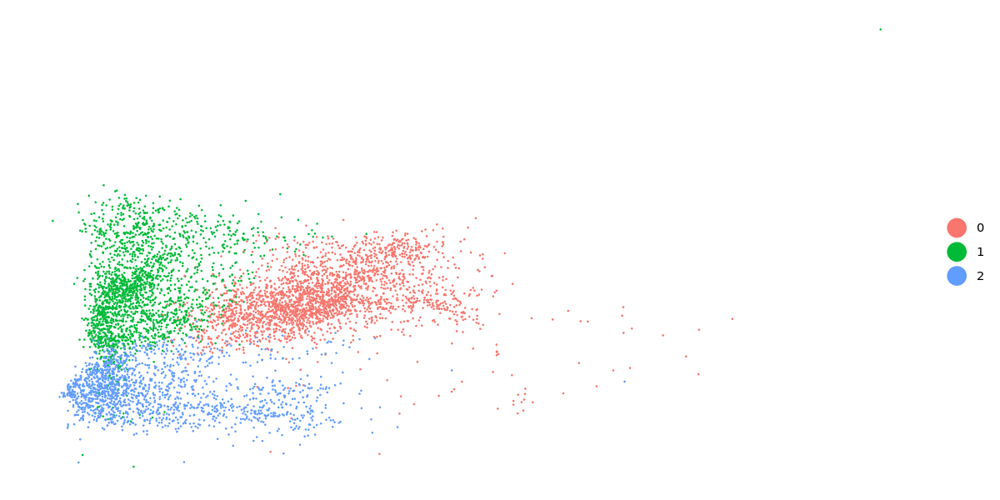

In [11]:
rownames(srat@meta.data) <- srat@meta.data$cell
srat@meta.data <- srat@meta.data[Cells(srat),]
srat_sub <- subset(srat, subset = (RNA_snn_res.0.6  == '5'))
srat_sub <- FindNeighbors(srat_sub, dims = 1:50, k.param = 30, reduction = "pca")
srat_sub <- FindClusters(srat_sub, resolution = 0.3, random.seed=0)
p <- ggplot(data=srat_sub@meta.data, mapping = aes(x=X1, y=X2, colour=`RNA_snn_res.0.3`)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  #scale_colour_manual(values = cluster_colours[cluster_order], name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  theme(line = element_blank(),
        axis.text=element_blank(),
        title = element_blank())
print(p)


plot_df_joined[cell %in% srat_sub@meta.data$cell[srat_sub@meta.data$`RNA_snn_res.0.3` == 0], cluster := 'Early Anterior PSM']
plot_df_joined[cell %in% srat_sub@meta.data$cell[srat_sub@meta.data$`RNA_snn_res.0.3` == 1], cluster := 'Late Anterior PSM']
plot_df_joined[cell %in% srat_sub@meta.data$cell[srat_sub@meta.data$`RNA_snn_res.0.3` == 2], cluster := 'Somites']
srat@meta.data$cluster <- NULL
srat@meta.data <- merge(srat@meta.data, plot_df_joined[,c("cell", "cluster")], all.x=TRUE, all.y=FALSE)

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 2
components: 

 log-likelihood    n df      BIC      ICL
       550.4671 5757 11 1005.694 300.3567

Clustering table:
   1    2 
2816 2941 

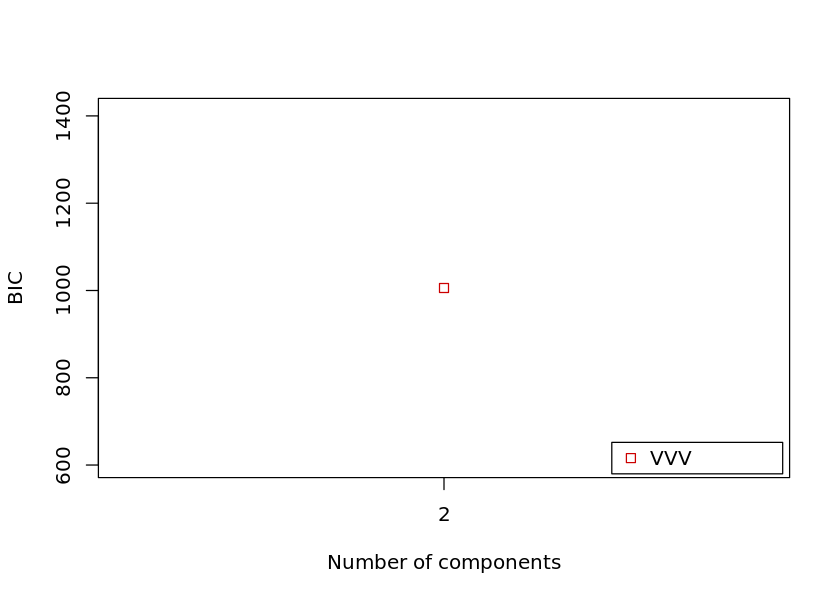

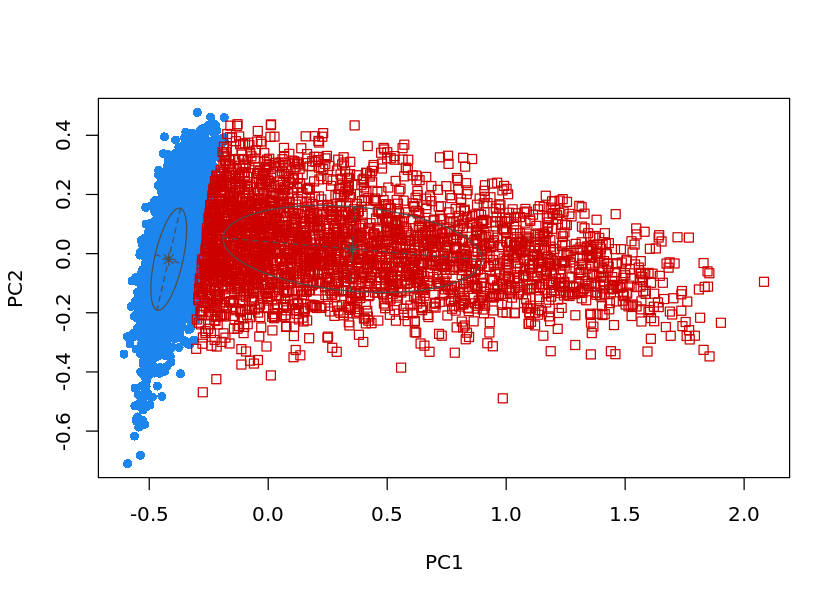

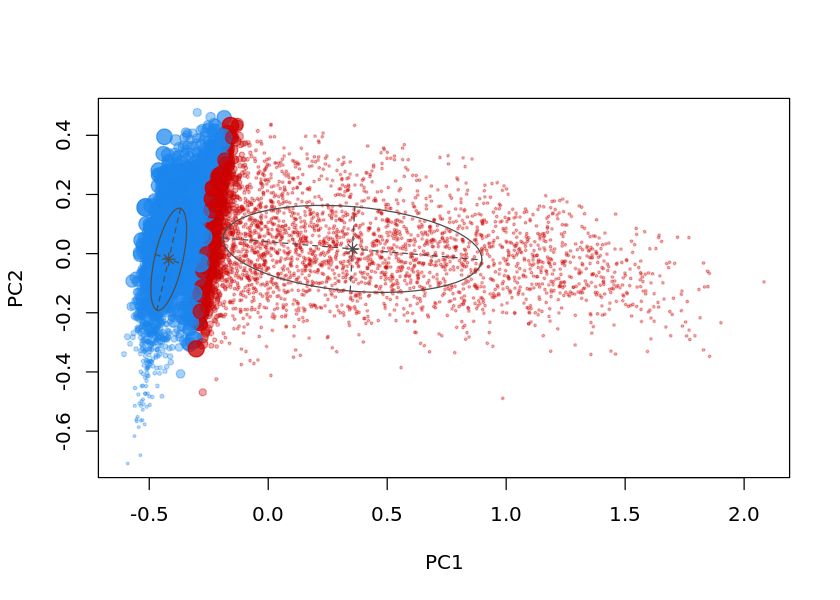

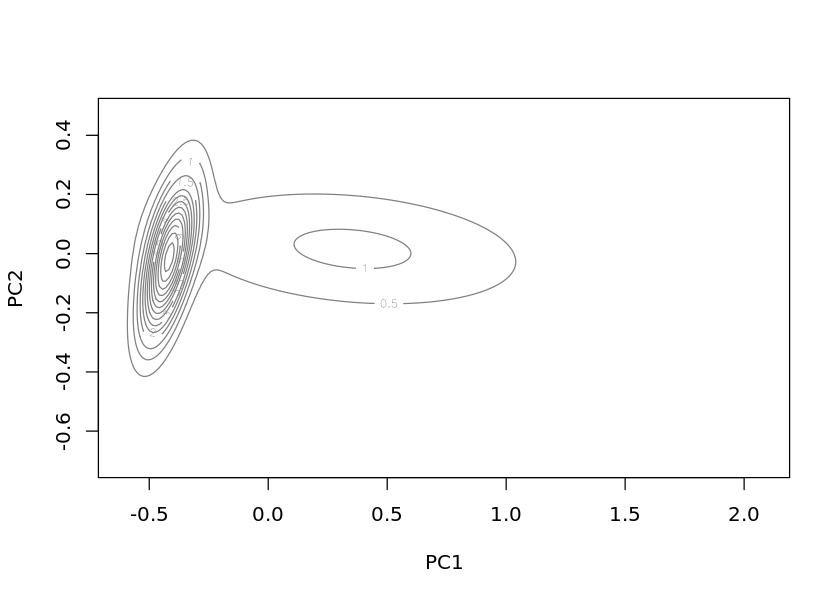

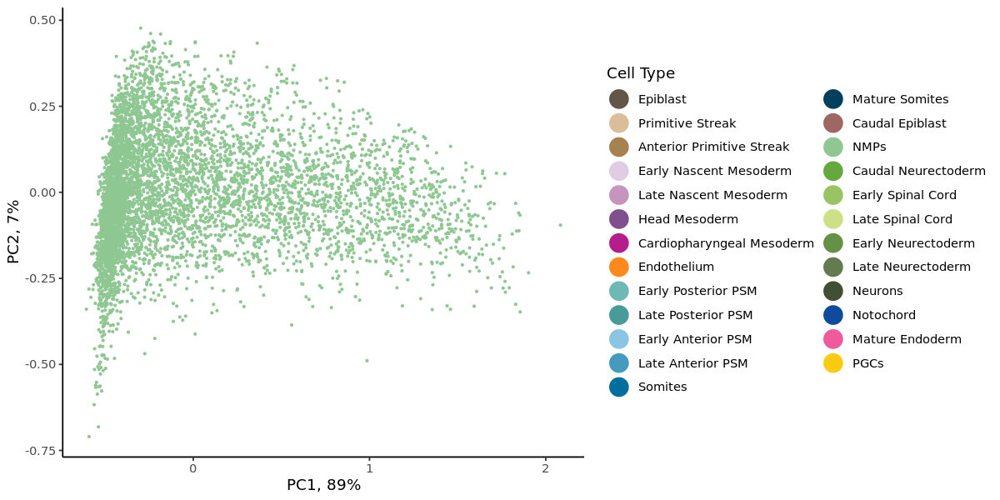

...

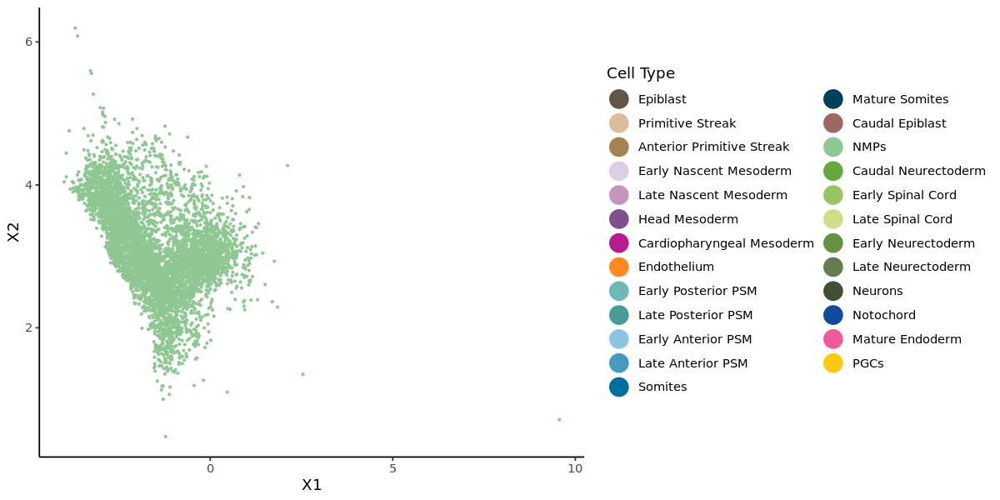

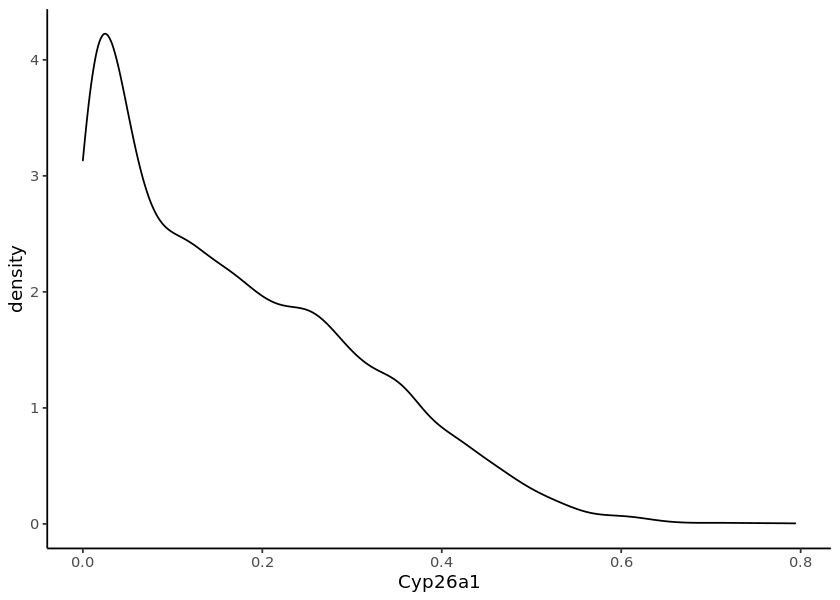

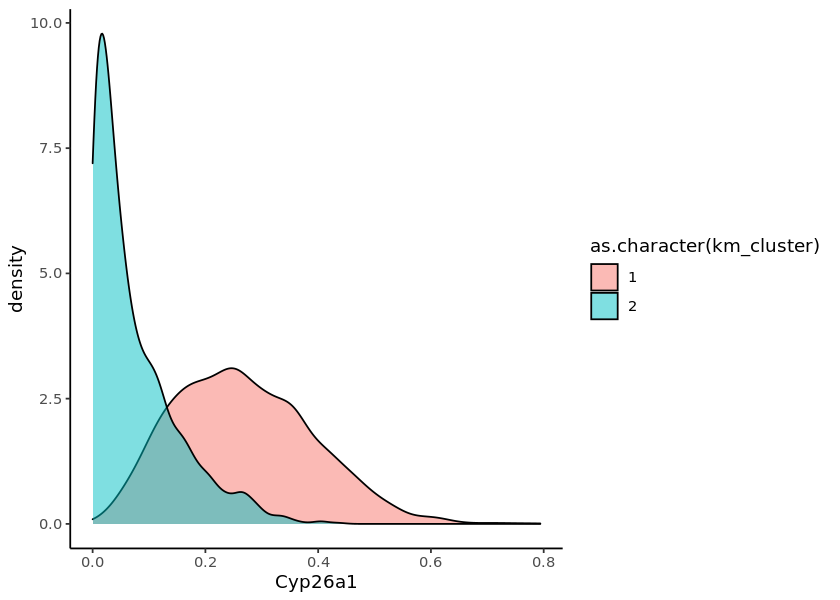

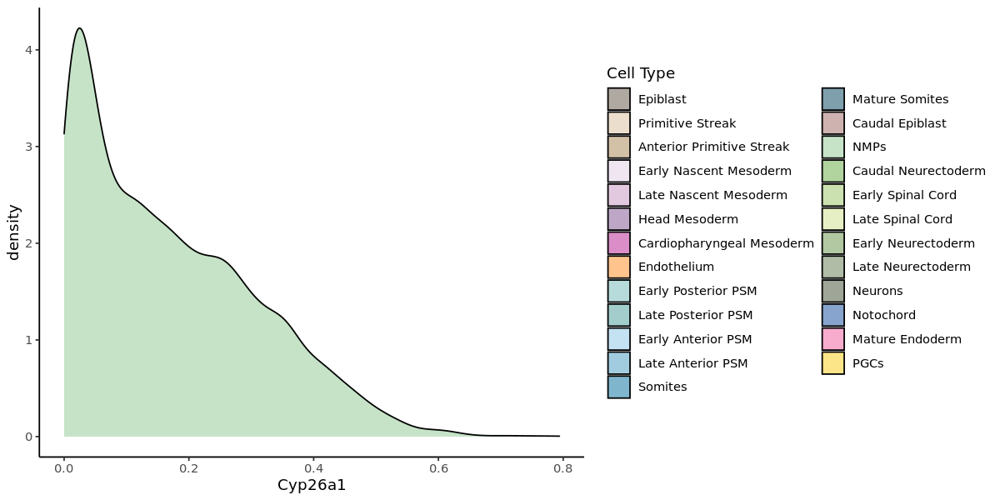

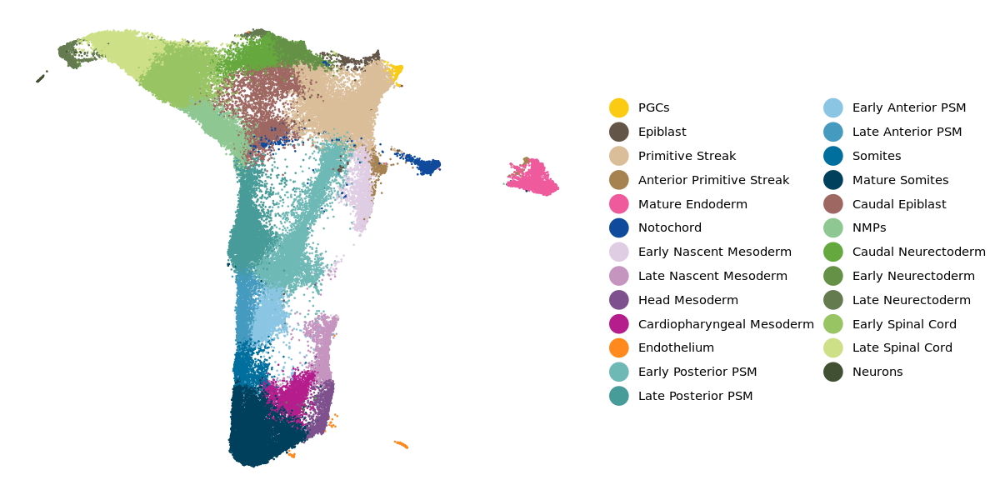

In [12]:
#mygenes <- c( 
#              'Pou5f1', 'Hoxc8', 'Hoxb9', 'Hoxaas3', 'Pim2', # Caudal Epiblast
#              'T', 'Fgf17', 'Cyp26a1', 'Sox2' # NMPs
#            )
mygenes <- c( 
              'Pou5f1', 'Pim2', # Caudal Epiblast
              'Cyp26a1', 'Sox2' # NMPs
            )

gen_selec <- as.data.table(srat@assays$RNA@meta.features)[symbol %in% unique(mygenes), c("ens_id", "symbol")]

tmp <- as.data.table(srat@meta.data)
tmp2 <- as.matrix(srat@assays[['RNA']]@data[gen_selec$ens_id,])
idx <- split(as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@i+1, rownames(srat@graphs[['RNA_nn']])[as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@j+1])
tmp2 <- lapply(idx, function(x) rowMeans(tmp2[,x])) %>% do.call(rbind, .) %>% as.data.frame
colnames(tmp2) <- gen_selec$symbol
tmp2$cell <- rownames(tmp2)
tmp <- merge(tmp, tmp2, by="cell")

topca <- tmp[(`RNA_snn_res.0.6` %in% c('7'))]
foo <- prcomp( #eval(paste0('~ ', paste(unique(mygenes), collapse=' + '))) ,
              #~ Pou5f1 + Hoxc8 + Hoxb9 + Hoxaas3 + Pim2 + T + Fgf17 + Cyp26a1 + Sox2,
              ~ Pou5f1 + Cyp26a1 + Sox2 + Pim2,
              data = topca,
              scale = FALSE
             )
PC_var <- round((foo[[1]]**2)/sum(foo[[1]]**2)*100)

tmp2 <- data.table(foo$x)
tmp2$cell <- topca$cell
tmp <- merge(tmp, tmp2, by='cell')

rotation <- as.data.frame(foo$rotation)
rotation$gene <- rownames(rotation)

#set.seed(2402)
#km <- kmeans(tmp[,c("PC1", "PC2")], centers=4, nstart=10)
#tmp$km_cluster <- km$cluster
               
library(mclust)
set.seed(2402)
fit <- Mclust(tmp[,c("PC1", "PC2")], G=2, model="VVV")
summary(fit)
options(repr.plot.width=7, repr.plot.height=5)
plot(fit)
tmp$km_cluster <- as.character(fit$classification)

options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=cluster)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=PC1, y=PC2, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    #scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=5, repr.plot.height=5)
p <- ggplot(rotation, aes(x=PC1, y=PC2)) +
    geom_point(size=0.5) +
    labs(x=paste0("PC1, ",PC_var[1],"%"),
         y=paste0("PC2, ",PC_var[2],"%")) +
    geom_label_repel(aes(label = gene),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                     max.overlaps = 100,
                     colour='black',
                       fill = alpha(c("white"),0),
                     size=3,
                  segment.color = 'grey50') +
    theme_classic()
print(p)
               
options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=X1, y=X2, colour=as.character(km_cluster))) +
    geom_point(size=0.5) +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=X1, y=X2, colour=cluster)) +
    geom_point(size=0.5) +
    scale_colour_manual(values = cluster_colours, name = "Cell Type") +
    guides(colour = guide_legend(override.aes = list(size=6))) +
    theme_classic()
print(p)

options(repr.plot.width=7, repr.plot.height=5)
p <- ggplot(tmp, aes(x=Cyp26a1)) +
    geom_density() +
    theme_classic()
print(p)
p <- ggplot(tmp, aes(x=Cyp26a1, fill=as.character(km_cluster))) +
    geom_density(alpha=0.5) +
    theme_classic()
print(p)
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(tmp, aes(x=Cyp26a1, fill=cluster)) +
    geom_density(alpha=0.5) +
    scale_fill_manual(values = cluster_colours, name = "Cell Type") +
    theme_classic()
print(p)

plot_df_joined[cell %in% tmp[((km_cluster!=1) & (Cyp26a1 < 0.1))]$cell, cluster := 'Caudal Epiblast']
srat@meta.data$cluster <- NULL
srat@meta.data <- merge(srat@meta.data, plot_df_joined[,c("cell", "cluster")], all.x=TRUE, all.y=FALSE)
               
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=cluster)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = cluster_colours[cluster_order], name = "Celltype") +
  #scale_colour_manual(values = cluster_colours, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  theme(line = element_blank(),
        axis.text=element_blank(),
        title = element_blank())
print(p)

In [13]:
colour <- round((col2rgb('#4d8db4') + col2rgb('#85ad76'))/2)
rgb(colour[1,1], colour[2,1], colour[3,1], maxColorValue = 255)

[1] "#699D95"

In [14]:
source('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/gastruloids_scRNAseq/plotting_settings.R')

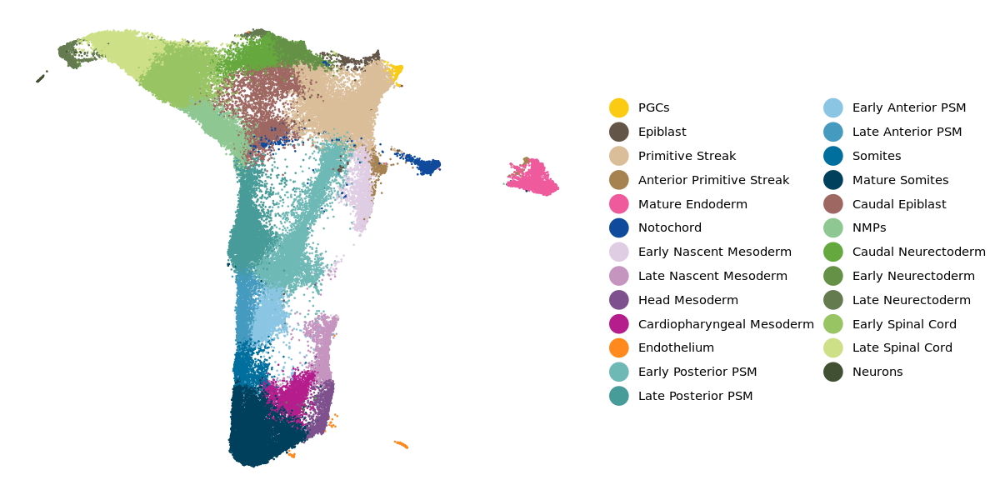

In [15]:
options(repr.plot.width=10, repr.plot.height=5)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=cluster)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = cluster_colours[cluster_order], name = "Celltype") +
  #scale_colour_manual(values = cluster_colours, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  theme(line = element_blank(),
        axis.text=element_blank(),
        title = element_blank())
print(p)

In [16]:
rownames(srat@meta.data) <- srat@meta.data$cell
srat@meta.data <- srat@meta.data[Cells(srat),]

# Plot marker gene expression matrix

In [17]:
suppressPackageStartupMessages(library(matrixStats))

In [18]:
markers <- list()
markers[["PGCs"]] <- c("Dppa5a", "Utf1", "Zfp42")
markers[["Primitive Streak"]] <- c("Pou5f1", "T", "Wnt3")
markers[["Anterior Primitive Streak"]] <- c("T", "Foxa2")
markers[["Notochord"]] <- c("Foxa2", "Noto", "Shh", "Sox17")
markers[["Mature Endoderm"]] <- c("Foxa2", "Sox17", "Trh")
markers[["NMPs"]] <- c("T", "Sox2", "Fgf17", "Cyp26a1")
markers[["Caudal Epiblast"]] <- c("Pou5f1", "Pim2", "Hoxc8", "Hoxaas3", "Hoxb9")
markers[["Posterior Presomitic Mesoderm"]] <- c("Dll1", "Msgn1", "Tbx6", "Hoxb6", "Hoxb9", "Hoxaas3", "Fst", "Pou5f1")
markers[["Anterior Presomitic Mesoderm"]] <- c("Mesp2", "Pcdh8", "Ripply2")
markers[["Somites"]] <- c("Dmrt2", "Gadd45g", "Lfng")
markers[["Mature Somites"]] <- c("Foxd2", "Igfbp5", "Meox2")
markers[["Nascent Mesoderm"]] <- c("Cyp26a1", "Lhx1", "Mesp1")
markers[["Head Mesoderm"]] <- c("Igfbp5", "Sox9")
markers[["Cardiopharyngeal Mesoderm"]] <- c("Bmp4", "Hand2", "Isl1", "Lix1", "Rgs5")
markers[["Endothelium"]] <- c("Cdh5", "Cldn5", "Kdr")
markers[["Early Neurectoderm"]] <- c("Thy1", "Pim2", "Hes3")
markers[["Late Neurectoderm"]] <- c("Hoxc6", "Hoxc8", "Fabp7", "Sox1")
markers[["Spinal Cord"]] <- c("Hoxc6", "Hoxc8", "Pax6", "Sox2", "Sox1", "Irx3")
markers[["Neurons"]] <- c("Tubb3", "Elavl3")

gene_order <- c("Dppa5a", "Utf1", "Zfp42", "Pou5f1", "Fst", "Wnt3", "T", "Foxa2", "Noto", "Shh", "Sox17", "Trh", "Cyp26a1",
                "Lhx1", "Mesp1", "Sox9", "Igfbp5", "Foxd2", "Isl1", "Bmp4", "Hand2", "Cdh5", "Cldn5", "Kdr", "Dll1",
                "Msgn1", "Tbx6", "Hoxaas3", "Hoxb6", "Hoxb9", "Hoxc6", "Hoxc8", "Mesp2", "Pcdh8", "Ripply2", "Lfng", "Gadd45g",
                "Dmrt2", "Meox2", "Sox2", "Fgf17", "Thy1", "Hes3", "Pim2", "Sox1", "Pax6", "Irx3", "Fabp7", 
                "Tubb3", "Elavl3"
                )

In [19]:
gen_selec <- as.data.table(srat@assays$RNA@meta.features)[symbol %in% unique(unname(unlist(markers))), c("ens_id", "symbol")]

tmp <- as.data.table(srat@meta.data)
tmp2 <- as.matrix(srat@assays[['RNA']]@data[gen_selec$ens_id,])
idx <- split(as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@i+1, rownames(srat@graphs[['RNA_nn']])[as(t(srat@graphs[['RNA_nn']]), "dgTMatrix")@j+1])
tmp2 <- lapply(idx, function(x) rowMeans(tmp2[,x])) %>% do.call(rbind, .) %>% as.data.frame
colnames(tmp2) <- gen_selec$symbol
tmp2$cell <- rownames(tmp2)
tmp.normed <- merge(tmp[,c("cell", "cluster")], tmp2, by="cell")

Warning message in melt(to.plot, id.vars = "cluster", value.name = "mean", variable.name = "gene"):
“The melt generic in data.table has been passed a data.frame and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is deprecated, and this redirection is now deprecated as well. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace like reshape2::melt(to.plot). In the next version, this warning will become an error.”


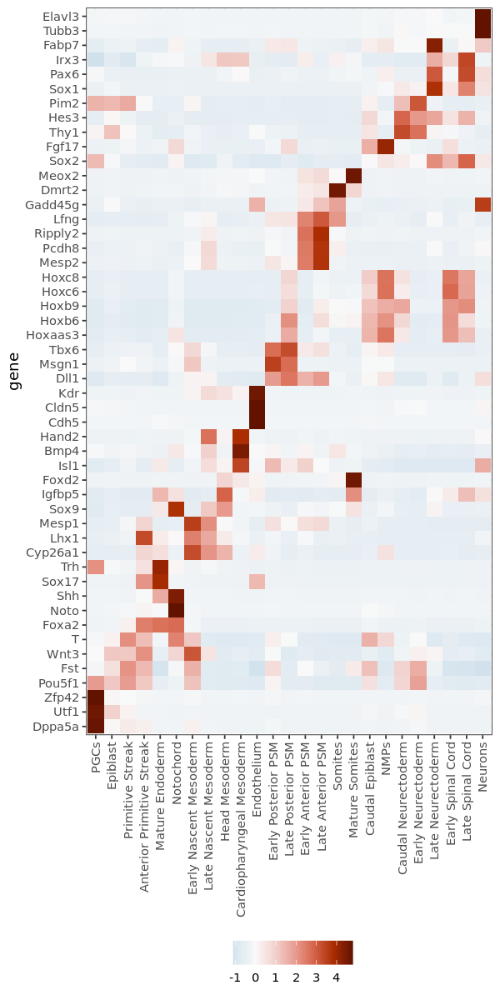

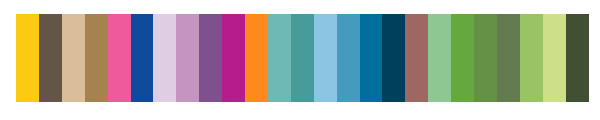

In [20]:
# mean then scaled

library(colorspace)

to.plot <- tmp.normed[, lapply(.SD, mean, na.rm=TRUE), by=cluster, .SDcols=gen_selec$symbol ] %>% as.data.frame
rownames(to.plot) <- to.plot$cluster
to.plot$cluster <- NULL
to.plot <- as.matrix(to.plot)
to.plot <- t((t(to.plot) - colMeans(to.plot))/sqrt(colVars(to.plot))) %>% as.data.frame
to.plot$cluster <- rownames(to.plot)
to.plot <- melt(to.plot, id.vars = "cluster", value.name = "mean", variable.name = "gene") %>% as.data.table
to.plot <- to.plot[gene %in% gene_order]
to.plot$cluster <- factor(to.plot$cluster, levels = cluster_order)
to.plot$gene <- factor(to.plot$gene, levels = gene_order)

options(repr.plot.width=5, repr.plot.height=10)
p <- ggplot(data=to.plot, mapping = aes(x=cluster, y=gene, fill=mean)) +
  geom_tile() +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  scale_fill_continuous_divergingx(palette = "RdBu", mid = 0, rev=TRUE, name="") +
  theme_bw() +
  #theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1, colour=cluster_colours))
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1),
        axis.title.x = element_blank(),
        legend.position="bottom", legend.box = "horizontal"
       )
print(p)
ggsave(
  '/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/final_plots/Fig1/D_heatmap.pdf',
  plot = p,
  device = 'pdf',
  width = 5,
  height = 10,
  units = "in"
)


options(repr.plot.width=5, repr.plot.height=1)
p <- ggplot(data=to.plot, mapping = aes(x=cluster, y=1, fill=cluster)) +
  geom_tile() +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  scale_fill_manual(values = cluster_colours) +
  theme_classic() +
  theme(line = element_blank(),
        axis.text=element_blank(),
        title = element_blank(),
        legend.position = "None"
       )
print(p)
ggsave(
  '/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/final_plots/Fig1/D_colourbar.pdf',
  plot = p,
  device = 'pdf',
  width = 5,
  height = 1,
  units = "in"
)

# Load and merge mapping results

In [21]:
experiments <- c('gastr_d3', 'gastr_d4', 'MULTI/exp3B_d4_d4.5', 'MULTI/exp4_d3', 'MULTI/exp5_d3.5_d4', 'MULTI/exp6_d4.5_d5', 'MULTI/exp1_d5', 'MULTI/exp3C_d4_d4.5')

mapping_meta_original <- list()
for (exp in experiments) {
    mapping_meta_original[[exp]] <- fread(paste0('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/mapping/', exp, '_original.txt.gz'))[!is.na(celltype.mapped.original)]
}
mapping_meta_original <- rbindlist(mapping_meta_original)
mapping_meta_original <- setnames(mapping_meta_original, c('celltype.score', 'cellstage.score'), c('celltype.score.original', 'cellstage.score.original'))

mapping_meta_extended <- list()
mapping_extended <- list()
for (exp in experiments) {
    mapping_meta_extended[[exp]] <- fread(paste0('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/mapping/', exp, '_extended.txt.gz'))[!is.na(celltype.mapped.extended)]
    mapping_extended[[exp]] <- readRDS(paste0('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/mapping/', exp, '_extended.rds'))
}
mapping_meta_extended <- rbindlist(mapping_meta_extended)
mapping_meta_extended <- setnames(mapping_meta_extended, c('celltype.score', 'cellstage.score'), c('celltype.score.extended', 'cellstage.score.extended'))

cols <- intersect(colnames(mapping_meta_original),colnames(mapping_meta_extended))
mapping_meta <- merge(mapping_meta_original, mapping_meta_extended, by=cols)

mapping_meta[MULTI_class %in% as.vector(unlist(neural)), gastr_type := "neural"]
mapping_meta[MULTI_class %in% as.vector(unlist(mesodermal)), gastr_type := "mesodermal"]
mapping_meta[MULTI_class %in% as.vector(unlist(intermediate)), gastr_type := "intermediate"]

In [22]:
cols <- c("cell", colnames(mapping_meta)[!(colnames(mapping_meta) %in% colnames(srat@meta.data))])
srat@meta.data <- merge(srat@meta.data, mapping_meta[,..cols], by="cell")
rownames(srat@meta.data) <- srat@meta.data$cell
srat@meta.data <- srat@meta.data[Cells(srat),]
srat@meta.data

,cell,X1,X2,orig.ident,nCount_RNA,nFeature_RNA,barcode,experiment,timepoint,organoid,⋯,stage.mapped.extended,closest.cell.extended,celltype.score.extended,cellstage.score.extended,celltype.mapped.descendant.extended,stage.mapped.descendant.extended,closest.cell.descendant.extended,celltype.score.descendant,cellstage.score.descendant,gastr_type
,<chr>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>
cell_3_gastr_d3,cell_3_gastr_d3,4.685431,5.266006209,cell,44612,6445,AAACCCACATGGCACC-1,gastr_d3,d3,gastr,⋯,E7.0,cell_15141,0.8333333,0.8333333,Primitive Streak,E7.0,cell_15141,0.5666667,0.8333333,NA
cell_4_gastr_d3,cell_4_gastr_d3,3.426244,4.101461837,cell,20206,4489,AAACCCACATGTCTAG-1,gastr_d3,d3,gastr,⋯,E7.0,cell_29034,1.0000000,0.5333333,Primitive Streak,E7.0,cell_29034,1.0000000,0.5333333,NA
cell_5_gastr_d3,cell_5_gastr_d3,3.748455,-0.282176934,cell,7585,2511,AAACCCAGTAGATGTA-1,gastr_d3,d3,gastr,⋯,E7.25,cell_6300,1.0000000,0.5333333,Nascent mesoderm,E7.25,cell_6300,1.0000000,0.5333333,NA
cell_6_gastr_d3,cell_6_gastr_d3,3.529151,-0.500261009,cell,11023,3401,AAACCCAGTCGCATGC-1,gastr_d3,d3,gastr,⋯,mixed_gastrulation,cell_56973,0.9000000,0.5000000,Nascent mesoderm,mixed_gastrulation,cell_56973,1.0000000,0.5000000,NA
cell_7_gastr_d3,cell_7_gastr_d3,3.852318,2.843122876,cell,19542,4362,AAACCCAGTGAGCAGT-1,gastr_d3,d3,gastr,⋯,E7.0,cell_111781,0.9333333,0.8333333,Primitive Streak,E7.0,cell_111781,0.9333333,0.8333333,NA
cell_9_gastr_d3,cell_9_gastr_d3,4.012558,5.321716389,cell,9992,3003,AAACCCATCCGTGACG-1,gastr_d3,d3,gastr,⋯,E7.25,cell_82446,0.3666667,0.5666667,Primitive Streak,E7.25,cell_82446,0.5666667,0.5666667,NA
cell_11_gastr_d3,cell_11_gastr_d3,4.172086,-0.126729757,cell,19838,4304,AAACGAAAGGTCCCTG-1,gastr_d3,d3,gastr,⋯,E7.0,cell_29820,0.8333333,0.7333333,Anterior Primitive Streak,E7.0,cell_29820,0.7333333,0.7333333,NA
cell_12_gastr_d3,cell_12_gastr_d3,3.812884,-0.219818339,cell,13758,3575,AAACGAACAGTTGCGC-1,gastr_d3,d3,gastr,⋯,E7.0,cell_109178,0.8333333,0.5333333,Nascent mesoderm,E7.0,cell_109178,1.0000000,0.5333333,NA
cell_14_gastr_d3,cell_14_gastr_d3,1.763890,0.044625574,cell,12205,3296,AAACGAAGTATAATGG-1,gastr_d3,d3,gastr,⋯,E7.25,cell_77310,0.6333333,0.5333333,Nascent mesoderm,E7.25,cell_77310,0.8666667,0.5333333,NA


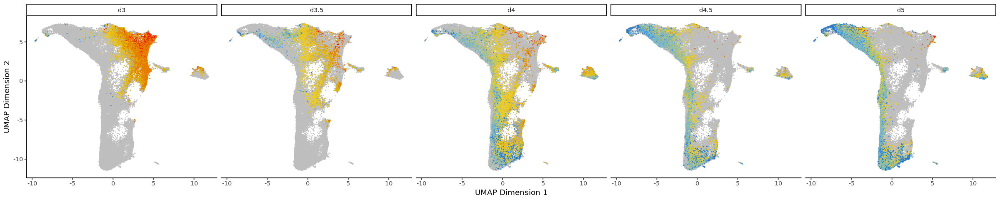

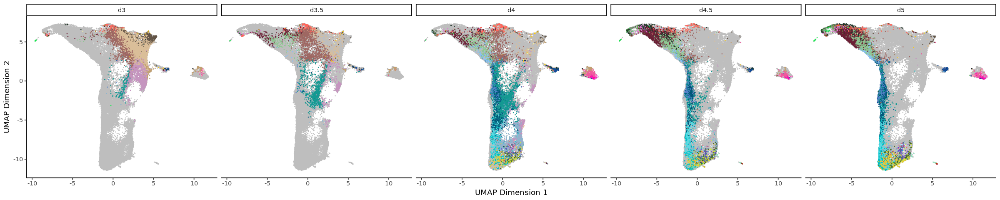

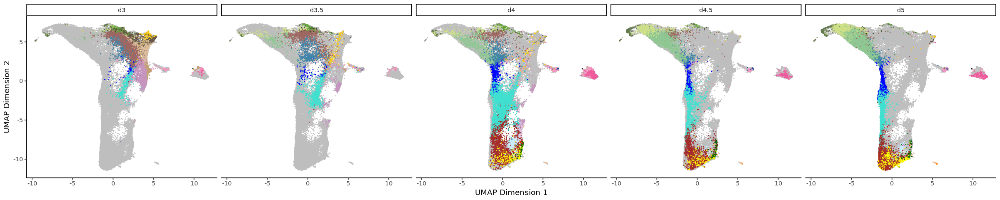

In [23]:
options(repr.plot.width=20, repr.plot.height=4)
p <- ggplot(data=mapping_meta[timepoint %in% c("d3", "d3.5", "d4", "d4.5", "d5")], mapping = aes(x=X1, y=X2, colour=stage.mapped.extended)) +
  geom_point(data=select(mapping_meta,-timepoint), colour="grey", size=0.1, alpha=1) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = stage_colours_extension, name = "Mapped Stage") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  theme(legend.position = 'None') +
  facet_wrap(~ timepoint, nrow=1)
print(p)

p <- ggplot(data=mapping_meta[timepoint %in% c("d3", "d3.5", "d4", "d4.5", "d5")], mapping = aes(x=X1, y=X2, colour=celltype.mapped.extended)) +
  geom_point(data=select(mapping_meta,-timepoint), colour="grey", size=0.1, alpha=1) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = celltype_colours_final, name = "Cell Type Mapped") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  theme(legend.position = 'None') +
  facet_wrap(~ timepoint, nrow=1)
print(p)

p <- ggplot(data=mapping_meta[timepoint %in% c("d3", "d3.5", "d4", "d4.5", "d5")], mapping = aes(x=X1, y=X2, colour=celltype.mapped.original)) +
  geom_point(data=select(mapping_meta,-timepoint), colour="grey", size=0.1, alpha=1) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = celltype_colours, name = "Cell Type Mapped") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  theme(legend.position = 'None') +
  facet_wrap(~ timepoint, nrow=1)
print(p)

# Calculate normalised embryonic score

In [24]:
atlas.meta <- fread("/nfs/research/marioni/Leah/data/gastrulation10x/data/Extended/atlas_metadata.txt.gz")
atlas.meta_nmapped_corrected <- list()
for (exp in experiments) {
    atlas.meta_nmapped_corrected[[exp]] <- Reduce(rbind, mapping_extended[[exp]]$closest.cells)
    rownames(atlas.meta_nmapped_corrected[[exp]]) <- NULL
    cells <- colnames(atlas.meta_nmapped_corrected[[exp]])[colnames(atlas.meta_nmapped_corrected[[exp]]) %in% srat@meta.data$cell]
    atlas.meta_nmapped_corrected[[exp]] <- atlas.meta_nmapped_corrected[[exp]][,cells]
    atlas.meta_nmapped_corrected[[exp]] <- apply(atlas.meta_nmapped_corrected[[exp]], 2, function(c) as.data.table(rbind(table(atlas.meta[cell %in% c]$stage.mapped))))
    atlas.meta_nmapped_corrected[[exp]] <- rbindlist(atlas.meta_nmapped_corrected[[exp]], fill=TRUE)
    atlas.meta_nmapped_corrected[[exp]][is.na(atlas.meta_nmapped_corrected[[exp]])] <- 0
    atlas.meta_nmapped_corrected[[exp]] <- as.matrix(atlas.meta_nmapped_corrected[[exp]])
    atlas.meta_nmapped_corrected[[exp]] <- sapply(colnames(atlas.meta_nmapped_corrected[[exp]]), function(c) atlas.meta_nmapped_corrected[[exp]][,c]/sum(atlas.meta$stage.mapped==c))
    atlas.meta_nmapped_corrected[[exp]] <- atlas.meta_nmapped_corrected[[exp]]/rowSums(atlas.meta_nmapped_corrected[[exp]])
    atlas.meta_nmapped_corrected[[exp]] <- as.data.table(atlas.meta_nmapped_corrected[[exp]])
    atlas.meta_nmapped_corrected[[exp]]$cell <- cells

}
atlas.meta_nmapped_corrected <- rbindlist(atlas.meta_nmapped_corrected, use.names=TRUE)
atlas.meta_nmapped_corrected <- merge(melt(atlas.meta_nmapped_corrected, id.vars = "cell", variable.name = "stage.nmapped", value.name = "N"), srat@meta.data, by="cell", all.x=TRUE)
atlas.meta_nmapped_corrected$stage.nmapped.numeric <- as.numeric(sub('E', '', atlas.meta_nmapped_corrected$stage.nmapped))
atlas.meta_nmapped_corrected[,score := stage.nmapped.numeric*N]
atlas.meta_nmapped_corrected[,cellscore := sum(score), by=c("cell")]
atlas.meta_nmapped_corrected[MULTI_class %in% as.vector(unlist(neural)), gastr_type := "neural"]
atlas.meta_nmapped_corrected[MULTI_class %in% as.vector(unlist(mesodermal)), gastr_type := "mesodermal"]
atlas.meta_nmapped_corrected[MULTI_class %in% as.vector(unlist(intermediate)), gastr_type := "intermediate"]
atlas.meta_nmapped_corrected$N <- NULL
atlas.meta_nmapped_corrected$stage.nmapped <- NULL
atlas.meta_nmapped_corrected$stage.nmapped.numeric <- NULL
atlas.meta_nmapped_corrected$score <- NULL
atlas.meta_nmapped_corrected <- unique(atlas.meta_nmapped_corrected)
dim(atlas.meta_nmapped_corrected)

[1] 77683    59

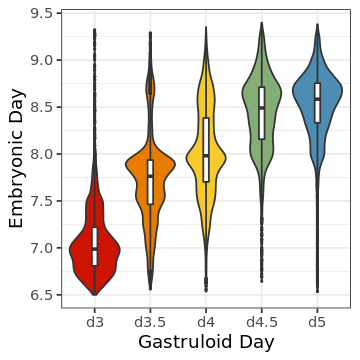

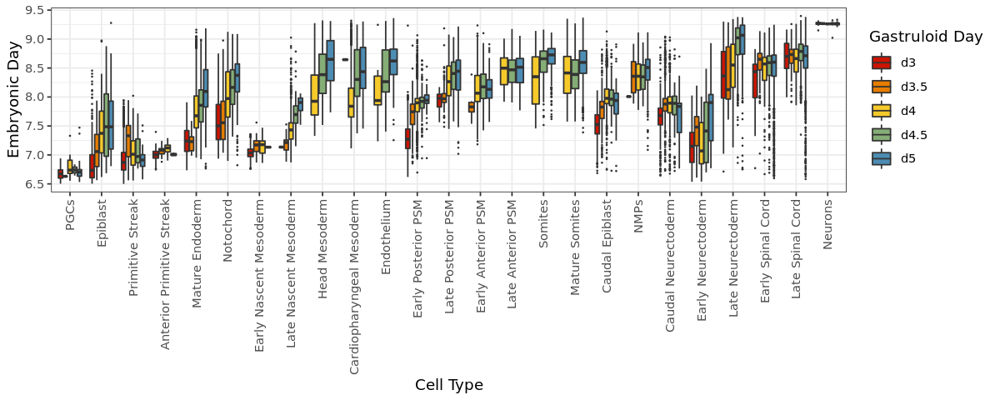

In [29]:
to.plot <- atlas.meta_nmapped_corrected
to.plot$cluster <- factor(to.plot$cluster, levels = cluster_order)
to.plot$gastr_type <- factor(to.plot$gastr_type, levels = gastr_type_order)

options(repr.plot.width=3, repr.plot.height=3)

ybreaks <- as.numeric(substring(names(stage_colours)[names(stage_colours) != 'mixed_gastrulation'], 2))
ybreaks <- sort(ybreaks[ybreaks %% 0.5 == 0])

p <- ggplot(to.plot[timepoint %in% c("d3", "d3.5", "d4", "d4.5", "d5")], aes(x=timepoint, y=cellscore, fill=timepoint)) +
  geom_violin() +
  geom_boxplot(width=0.1, outlier.size=0.2, fill="white") +
  #scale_fill_manual(values = gastr_type_colours, name = "Gastruloid Type") +
  #scale_fill_manual(values = cluster_colours, name = "") +
  scale_fill_manual(values = timepoint_colours, name = "") +
  scale_y_continuous(breaks = ybreaks) +
  labs(x="Gastruloid Day", y="Embryonic Day") +
  theme_bw() +
  theme(legend.position = 'None')
print(p)
ggsave(
  '/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/final_plots/Fig1/E.pdf',
  plot = p,
  device = 'pdf',
  width = 3,
  height = 3,
  units = "in"
)

options(repr.plot.width=10, repr.plot.height=4)
p <- ggplot(to.plot[(timepoint %in% c("d3", "d3.5", "d4", "d4.5", "d5"))], aes(x=cluster, y=cellscore, fill=timepoint)) +
  #geom_violin() +
  geom_boxplot(outlier.size=0.1) +
  #scale_fill_manual(values = gastr_type_colours, name = "Gastruloid Type") +
  #scale_fill_manual(values = cluster_colours, name = "Cell Type") +
  scale_fill_manual(values = timepoint_colours[names(timepoint_colours) %in% c("d3", "d3.5", "d4", "d4.5", "d5")], name = "Gastruloid Day") +
  scale_y_continuous(breaks =ybreaks ) +
  labs(x="Cell Type", y="Embryonic Day") +
  theme_bw() +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
print(p)
ggsave(
  '/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/final_plots/SuppFig3/A.pdf',
  plot = p,
  device = 'pdf',
  width = 10,
  height = 4,
  units = "in"
)

In [25]:
new_sratmd <- as.data.frame(atlas.meta_nmapped_corrected)
rownames(new_sratmd) <- new_sratmd$cell
srat@meta.data <- new_sratmd[Cells(srat),]

# Add normalised QC metrics

In [26]:
srat@meta.data$percent.mt.normed <- ave(srat@meta.data$percent.mt, srat@meta.data$batch, FUN=function(x) (log2(x) - mean(log2(x)))/(sd(log2(x))))
srat@meta.data$nFeature_RNA.normed <- ave(srat@meta.data$nFeature_RNA, srat@meta.data$batch, FUN=function(x) (x - mean(x))/(sd(x)))
srat@meta.data$percent.ribo.normed <- ave(srat@meta.data$percent.ribo, srat@meta.data$batch, FUN=function(x) (x - mean(x))/(sd(x)))
srat@meta.data$nCount_RNA.normed <- ave(srat@meta.data$nCount_RNA, srat@meta.data$batch, FUN=function(x) (log2(x) - mean(log2(x)))/(sd(log2(x))))

# Add trajectory inference results

In [27]:
CellRank_md_meso <- fread("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/gastruloids_scRNAseq/mapping_eval/CellRank/wk_obs_meso.csv")
CellRank_md_neuro <- fread("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/gastruloids_scRNAseq/mapping_eval/CellRank/wk_obs_neuro.csv")
CellRank_md <- rbind(CellRank_md_meso, CellRank_md_neuro)
cols <- c(colnames(CellRank_md)[!(colnames(CellRank_md) %in% c(intersect(colnames(srat@meta.data), colnames(CellRank_md)), "V1"))], "cell")
new_sratmd <- merge(srat@meta.data, CellRank_md[,..cols], by="cell", all=TRUE)
rownames(new_sratmd) <- new_sratmd$cell
srat@meta.data <- new_sratmd[Cells(srat),]

# Save final files

In [28]:
fwrite(srat@meta.data, '/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/sample_metadata_final.txt.gz')
fwrite(srat@assays$RNA@meta.features,
       '/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/feature_metadata_final.txt.gz'
      )
saveRDS(srat, '/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/seurat_final.rds')
sce <- as.SingleCellExperiment(srat)
saveRDS(sce, "/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/sce_final.rds")